Prerequisites:
1. Run `steps/2_create_incountry_folds.ipynb` to create the `dhs_incountry_folds.pkl`.
2. Run only the first section of this `steps/3_dhs_baselines.ipynb` and then on parallel run `steps/4dhs.ipynb` to obtain `loc_dict.pkl` files 

# Imports and Constants

In [19]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

%cd '../'
!pwd
!pwd

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
/hdd/home/abenabbes/africapoverty/dossier1
/hdd/home/abenabbes/africapoverty/dossier1
/hdd/home/abenabbes/africapoverty/dossier1


In [20]:
from collections import defaultdict
import os
import pickle
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn.ensemble
import sklearn.neighbors

from batchers import batcher, dataset_constants
from models.histograms import (
    get_per_image_histograms,
    plot_band_hists,
    plot_label_hist,
    split_nl_hist)
from models.linear_model import ridge_cv
from models.knn import knn_cv_opt
from utils.analysis import calc_score, evaluate
from utils.general import load_npz
from utils.plot import scatter_preds
!pwd

/hdd/home/abenabbes/africapoverty/dossier1


In [21]:
os.environ['CUDA_VISIBLE_DEVICES'] = ''

DATASET_NAME = 'DHS-ALL'
LABEL_NAME = 'wealthpooled'

FOLDS = ['A', 'B', 'C', 'D', 'E']
SPLITS = ['train', 'val', 'test']
COUNTRIES = dataset_constants.DHS_COUNTRIES
print(COUNTRIES)

MEANS = dataset_constants.MEANS_DICT[DATASET_NAME]
STD_DEVS = dataset_constants.STD_DEVS_DICT[DATASET_NAME]
s=dataset_constants.SURVEY_NAMES[DATASET_NAME]

LOGS_ROOT_DIR = '../checkpoints/BASELINES/'
print(LOGS_ROOT_DIR)

(['angola', 'benin', 'burkina_faso', 'cameroon', 'cote_d_ivoire', 'democratic_republic_of_congo', 'ethiopia', 'ghana', 'guinea', 'kenya', 'lesotho', 'madagascar', 'malawi', 'mali', 'mozambique', 'nigeria', 'rwanda', 'senegal', 'sierra_leone', 'tanzania', 'togo', 'uganda', 'zambia', 'zimbabwe', 'comores'],)
/home/abenabbes/final_ex/ML/


# Load histograms (or create if needed)

In [22]:
# BAND_BIN_EDGES = [-10^5, -5.0, -4.9, -4.8, ..., 4.8, 4.9, 5.0, 10^5]
# BAND_BIN_CENTERS = [-5.05, -4.95, -4.85, ..., 4.85, 4.95, 5.05]
BAND_BIN_EDGES = np.concatenate([
    [-1e5],
    np.arange(-5.0, 5.1, 0.1),
    [1e5]
])
BAND_BIN_CENTERS = np.arange(-5.05, 5.15, 0.1)

# LABEL_BIN_EDGES = [-2.0, -1.9, ..., 2.8, 2.9]
# LABEL_BIN_CENTERS = [-1.95, -1.85, ..., 2.75, 2.85]
LABEL_BIN_EDGES = np.arange(-2.0, 3.0, 0.1)
LABEL_BIN_CENTERS = np.arange(-1.95, 2.95, 0.1)

# band name => color for plotting
BAND_COLORS = {
    'BLUE'  : 'blue',
    'GREEN' : 'green',
    'RED'   : 'red',
    'SWIR1' : 'purple',
    'SWIR2' : 'brown',
    'TEMP1' : 'orange',
    'NIR'   : 'pink',
    'NIGHTLIGHTS': 'black',
    'DMSP'  : 'black',
    'VIIRS' : 'gray',
}
BAND_ORDER = ['BLUE', 'GREEN', 'RED', 'SWIR1', 'SWIR2', 'TEMP1', 'NIR', 'NIGHTLIGHTS']
BAND_ORDER_NLSPLIT = ['BLUE', 'GREEN', 'RED', 'SWIR1', 'SWIR2', 'TEMP1', 'NIR', 'DMSP', 'VIIRS']

BANDS_DICT = {
    'rgb': [0, 1, 2],
    'rgbnl': [0, 1, 2, 7, 8],
    'ms': [0, 1, 2, 3, 4, 5, 6],
    'msnl': [0, 1, 2, 3, 4, 5, 6, 7, 8],
    'nl': [7, 8],
}

In [23]:
def get_batcher(tfrecord_files):
    return batcher.Batcher(
        tfrecord_files=tfrecord_files,
        dataset=DATASET_NAME,
        batch_size=128,
        ls_bands='ms',
        nl_band='merge',
        label_name=LABEL_NAME,
        shuffle=False,
        augment=False,
        negatives='zero',
        normalize=True)

In [24]:
# as example the npz file can be acquired from the checkpoints (Zenodo)

file_path = '../checkpoints/dhs_image_hists.npz'
print(file_path)

if not os.path.exists(file_path):
    # THIS REQUIRES >= 35 GB RAM
    tfrecord_paths = batcher.get_tfrecord_paths(dataset=DATASET_NAME, split='all')
    init_iter, batch_op = get_batcher(tfrecord_paths).get_batch()
    results = get_per_image_histograms(init_iter, batch_op, band_bin_edges=BAND_BIN_EDGES)
    print(results)
    print('Saving image histograms to', file_path)
    np.savez_compressed(file_path, **results)

/hdd/home/abenabbes/final_ex/dhs_co.npz
benin_2012
benin_2017
democratic_republic_of_congo_2013
guinea_1999
guinea_2012
guinea_2018
kenya_2003
kenya_2008
kenya_2014
kenya_2015
malawi_2010
malawi_2017
malawi_2012
malawi_2014
madagascar_1997
madagascar_2008
madagascar_2011
madagascar_2013
malawi_2004
malawi_2015
nigeria_2010
madagascar_2016
nigeria_2003
nigeria_2008
comores_2012
nigeria_2013
nigeria_2018
nigeria_2015
rwanda_2010
rwanda_2015
rwanda_2019
senegal_2008
senegal_2015
senegal_2016
senegal_2017
senegal_2018
senegal_2019
senegal_2010
senegal_2012
senegal_2014
sierra_leone_2008
sierra_leone_2016
sierra_leone_2013
sierra_leone_2019
tanzania_2003
tanzania_2007
tanzania_2017
tanzania_2010
tanzania_2012
tanzania_2015
togo_2017
togo_2013
uganda_2006
uganda_2016
uganda_2018
uganda_2009
uganda_2011
uganda_2014
zimbabwe_2005
zimbabwe_2010
zimbabwe_2015
burkina_faso_1999
burkina_faso_2010
burkina_faso_2017
burkina_faso_2014
cote_d_ivoire_1998
cote_d_ivoire_2012
ghana_1998
ghana_2008
ghana_

In [25]:
result = load_npz(file_path)
image_hists = result['image_hists']
labels = result['labels']

locs = result['locs']
years = result['years']
nls_center = result["nls_center"]

nls_mean = result['nls_mean']

dmsp_mask = years < 2012
viirs_mask = ~dmsp_mask

image_hists: dtype=int64, shape=(36424, 8, 102)
labels: dtype=float32, shape=(36424,)
locs: dtype=float32, shape=(36424, 2)
years: dtype=int32, shape=(36424,)
nls_center: dtype=float32, shape=(36424,)
nls_mean: dtype=float32, shape=(36424,)


## Split NL band

In [10]:
# split NL band
image_hists = split_nl_hist(image_hists, years)
print(image_hists)
print(years)

[[[0.000e+00 0.000e+00 0.000e+00 ... 1.200e+01 9.000e+00 6.600e+01]
  [0.000e+00 0.000e+00 0.000e+00 ... 3.600e+01 2.100e+01 6.200e+01]
  [0.000e+00 0.000e+00 0.000e+00 ... 0.000e+00 0.000e+00 1.000e+00]
  ...
  [0.000e+00 0.000e+00 0.000e+00 ... 0.000e+00 0.000e+00 0.000e+00]
  [0.000e+00 0.000e+00 0.000e+00 ... 9.920e+02 0.000e+00 0.000e+00]
  [0.000e+00 0.000e+00 0.000e+00 ... 0.000e+00 0.000e+00 0.000e+00]]

 [[0.000e+00 0.000e+00 0.000e+00 ... 1.080e+02 7.200e+01 2.120e+02]
  [0.000e+00 0.000e+00 0.000e+00 ... 1.850e+02 1.820e+02 4.540e+02]
  [0.000e+00 0.000e+00 0.000e+00 ... 0.000e+00 0.000e+00 1.000e+00]
  ...
  [0.000e+00 0.000e+00 0.000e+00 ... 0.000e+00 0.000e+00 0.000e+00]
  [0.000e+00 0.000e+00 0.000e+00 ... 9.920e+02 0.000e+00 0.000e+00]
  [0.000e+00 0.000e+00 0.000e+00 ... 0.000e+00 0.000e+00 0.000e+00]]

 [[0.000e+00 0.000e+00 0.000e+00 ... 3.300e+02 2.430e+02 5.610e+02]
  [0.000e+00 0.000e+00 0.000e+00 ... 1.048e+03 8.490e+02 3.046e+03]
  [0.000e+00 0.000e+00 0.000e+00

## Plot histograms

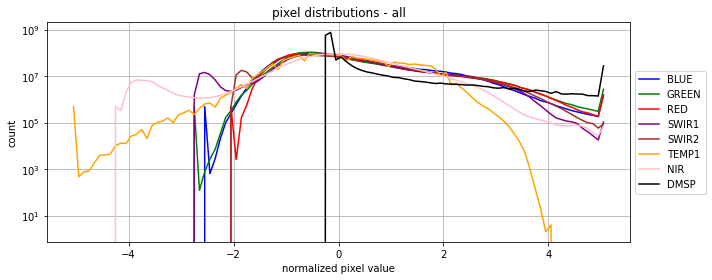

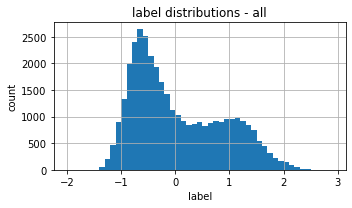

In [10]:
band_hists = np.sum(image_hists, axis=0, dtype=np.int64)  # shape [C, nbins]
plot_band_hists(
    band_hists,
    BAND_ORDER_NLSPLIT,
    band_colors=BAND_COLORS,
    bin_centers=BAND_BIN_CENTERS,
    xlabel='normalized pixel value',
    ylabel='count',
    title='pixel distributions - all',
    yscale='log')
plot_label_hist(
    labels=labels,
    bin_edges=LABEL_BIN_EDGES,
    title='label distributions - all',
    figsize=(5, 3))

# Load folds

## Incountry folds + loc_dict

`loc_dict` has the format:
```python
{
    (lat, lon): {
        'cluster': 1,
        'country': 'malawi',
        'country_year': 'malawi_2012',  # surveyID
        'households': 25,
        'urban': False,
        'wealth': -0.513607621192932,
        'wealthpooled': -0.732255101203918,
        'year': 2012
    }, ...
}
```

NOTE: `year` and `country_year` might differ in the year. `country_year` is the survey ID, which says which year the survey started. However, sometimes the DHS surveys cross the year-boundary, in which case `country_year` will remain the same but `year` will be the next year.

#### NOTICE: only run the first section of `3_dhs_baselines.ipynb`. Until this point its going to require the files `dhs_incountry_folds.pkl` and  `loc_dict.pkl` which will be generated when executing `4_dhs.ipynb`. After that, continue the execution here.

In [23]:

with open('../checkpoints/dhs_incountry_folds.pkl', 'rb') as f:
    incountry_folds = pickle.load(f)
    print(incountry_folds)

with open('../checkpoints/loc_dict.pkl', 'rb') as f:
    loc_dict = pickle.load(f)
    

incountry_group_labels = np.zeros_like(labels, dtype=np.int32)
for i, f in enumerate(FOLDS):
    test_indices = incountry_folds[f]['test']
    incountry_group_labels[test_indices] = i

{'A': {'test': array([    0,     1,    14, ..., 36154, 36157, 36163]), 'val': array([   20,    21,    24, ..., 36177, 36179, 36180]), 'train': array([    2,     3,     4, ..., 36176, 36178, 36181])}, 'B': {'test': array([   20,    21,    24, ..., 36177, 36179, 36180]), 'val': array([   10,    11,    12, ..., 36141, 36164, 36167]), 'train': array([    0,     1,     2, ..., 36176, 36178, 36181])}, 'C': {'test': array([   10,    11,    12, ..., 36141, 36164, 36167]), 'val': array([    6,     7,     8, ..., 36165, 36176, 36181]), 'train': array([    0,     1,     2, ..., 36178, 36179, 36180])}, 'D': {'test': array([    6,     7,     8, ..., 36165, 36176, 36181]), 'val': array([    2,     3,     4, ..., 36170, 36173, 36178]), 'train': array([    0,     1,    10, ..., 36177, 36179, 36180])}, 'E': {'test': array([    2,     3,     4, ..., 36170, 36173, 36178]), 'val': array([    0,     1,    14, ..., 36154, 36157, 36163]), 'train': array([    6,     7,     8, ..., 36179, 36180, 36181])}}


## `country_indices` and `country_labels`

`country_indices` is a dictionary that maps a country name to a sorted `np.array` of its indices
```python
{ 'malawi': np.array([ 8530,  8531,  8532, ..., 10484, 10485, 10486]), ... }
```

`country_labels` is a `np.array` that shows which country each example belongs to
```python
np.array([0, 0, 0, 0, ..., 22, 22, 22])
```
where countries are indexed by their position in `dataset_constants.DHS_COUNTRIES`

In [24]:
country_indices = defaultdict(list)  # country => np.array of indices
country_labels = np.zeros(len(locs), dtype=np.int32)  # np.array of country labels
households = np.zeros(len(locs), dtype=np.int32)  # np.array of household counts

for i, loc in enumerate(locs):
    country = loc_dict[tuple(loc)]['country']
    country_indices[country].append(i)
    households[i] = loc_dict[tuple(loc)]['households']
#values = ["angola", "benin", "malawi"]


values=["angola", "benin", "burkina_faso", "cameroon", "cote_d_ivoire",
        "democratic_republic_of_congo", "ethiopia", "ghana", "guinea", "kenya",
        "lesotho", "malawi", "mali", 
        "mozambique", "nigeria", "madagascar",
        "rwanda", "senegal", "sierra_leone",
        "tanzania", "togo", "uganda", "zambia", "zimbabwe"]

for i, country in enumerate(values):
    country_indices[country] = np.asarray(country_indices[country])
    indices = country_indices[country]
    country_labels[indices] = i
    print(country)
    
   

angola
benin
burkina_faso
cameroon
cote_d_ivoire
democratic_republic_of_congo
ethiopia
ghana
guinea
kenya
lesotho
malawi
mali
mozambique
nigeria
madagascar
rwanda
senegal
sierra_leone
tanzania
togo
uganda
zambia
zimbabwe


In [25]:
values = ["a", "b", "c"]
for value in values:
    print(value)

a
b
c


## OOC folds

In [26]:
# 'A': {
#     'train': np.array([1, 10, 13, ...]),
#     ...
# }
ooc_folds = {
    f: {split: [] for split in SPLITS}
    for f in FOLDS
}

for f in FOLDS:
   
    surveys_dict = dataset_constants_urbain.SURVEY_NAMES[f'2009-17{f}']
   
    
    for split, countries in surveys_dict.items():
        split_indices = np.sort(np.concatenate([
            country_indices[country] for country in countries
        ]))
        ooc_folds[f][split] = split_indices

## Urban v. Rural

In [27]:
def get_urban_rural_indices(locs, loc_dict):
    '''
    Args
    - locs: np.array, shape [N, 2]
    - loc_dict: dict, (lat, lon) => dict

    Returns
    - urban_indices: np.array, shape [num_urban]
    - rural_indices: np.array, shape [num_rural]
    '''
    urban_indices = []
    rural_indices = []

    for i, loc in enumerate(locs):
        loc = tuple(loc)
        if loc_dict[loc]['urban'] == 0:
            rural_indices.append(i)
        else:
            urban_indices.append(i)
    urban_indices = np.asarray(urban_indices)
    rural_indices = np.asarray(rural_indices)
    print(f'num urban: {len(urban_indices)}\t num rural: {len(rural_indices)}')
    return urban_indices, rural_indices

urban_indices, rural_indices = get_urban_rural_indices(locs, loc_dict)

num urban: 12724	 num rural: 23458


# Dumb Baseline Models

## Incountry: predict country mean

In [28]:
values=["angola", "benin", "burkina_faso", "cameroon", "cote_d_ivoire",
        "democratic_republic_of_congo", "ethiopia", "ghana", "guinea", "kenya",
        "lesotho", "malawi", "mali", 
        "mozambique", "nigeria", "madagascar",
        "rwanda", "senegal", "sierra_leone",
        "tanzania", "togo", "uganda", "zambia", "zimbabwe"]

mean_preds = np.zeros_like(labels)
for i, country in enumerate(values):
    indices = np.where(country_labels == i)[0]
    mean_preds[indices] = np.mean(labels[indices])
r2, _, _, _ = evaluate(labels, mean_preds, do_print=True)

r^2: 0.135, R^2: 0.135, mse: 0.592, rank: 0.375


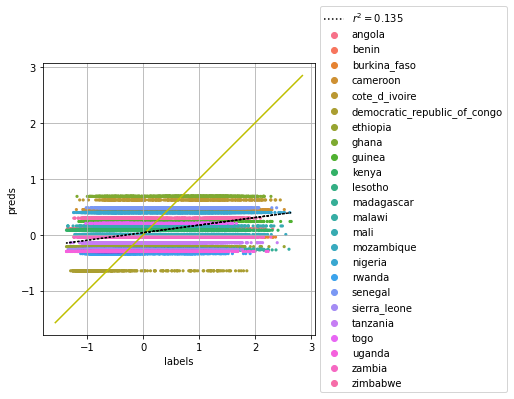

In [29]:
scatter_preds(labels, preds=mean_preds, by_name='country', by_col=np.asarray(values)[country_labels])

## Linear Nightlights

In [30]:
def linear_nl():
    linear_nl_df = pd.DataFrame(columns=['sensor', 'nl_type', 'weighted', 'r2'])
    linear_nl_df.set_index(['sensor', 'nl_type', 'weighted'], inplace=True)

    for sensor, mask in [('dmsp', dmsp_mask), ('viirs', viirs_mask)]:
        for nl_type, nls in [('center', nls_center), ('mean', nls_mean)]:
            for weighted, w in [(False, None), (True, households)]:
                if weighted:
                    w = w[mask]
                linear_nl_df.loc[(sensor, nl_type, weighted)] = calc_score(
                    labels[mask], nls[mask], metric='r2', weights=w)
    display(linear_nl_df)

linear_nl()

r2
sensor nl_type weighted          
dmsp   center  False     0.288709
               True      0.288154
       mean    False     0.283104
               True      0.283672
viirs  center  False     0.282669
               True      0.281032
       mean    False     0.279975
               True      0.277060

## KNN on Nightlights

The following section uses leave-one-fold-out CV. This is fine for "incountry" training, but is different from the leave-one-country-out CV used for our other OOC training. For the leave-one-country-out OOC results, see the section "KNN on Histograms" below.

In [31]:
def knn_nl_scalar(labels, years, nls_center, train_idxs, test_idxs, k=5):
    '''
    Args
    - labels: np.array, shape [N]
    - years: np.array, shape [N]
    - nls_center: np.array, shape [N]
    - splits: dict, split (str) => np.array
    - k: int, k for KNN
    '''
    train_nls = nls_center[train_idxs]

    # test
    test_nls = nls_center[test_idxs]
  
    test_labels = labels[test_idxs]
  
    preds = np.zeros_like(test_labels)
    knn_dmsp = sklearn.neighbors.KNeighborsRegressor(k)
    knn_viirs = sklearn.neighbors.KNeighborsRegressor(k)

    dmsp_mask = years < 2012
    viirs_mask = ~dmsp_mask

    for mask, model in [(dmsp_mask, knn_dmsp), (viirs_mask, knn_viirs)]:
        train_mask = mask[train_idxs]
        test_mask = mask[test_idxs]

        # assign each unique NL value the same label
        u, indices = np.unique(train_nls[train_mask], return_inverse=True)
        
        mean_labels = np.zeros_like(u)
        for i, nl in enumerate(u):
            mean_labels[i] = np.mean(labels[nls_center == nl])

        model.fit(X=train_nls[train_mask].reshape(-1, 1), y=mean_labels[indices])
        preds[test_mask] = model.predict(X=test_nls[test_mask].reshape(-1, 1))

    return preds, knn_dmsp, knn_viirs

In [32]:
def knn_cv_wrapper(labels, years, nls, folds, keep=1.0, seed=None, savepath=None, verbose=False):
    '''
    Args
    - labels: np.array, shape [N]
    - years: np.array, shape [N]
    - nls: np.array, shape [N]
    - folds: dict, folds[f][split] is a np.array of indices
    - keep: float, fraction of training and validation data to use
    - seed: int, random seed
    - savepath: str, path to save predictions
    - verbose: bool, whether to print out validation performance on each fold

    Returns
    - best_models: tuple of sklearn.neighbors.KNeighborsRegressor
        best models from the last fold
    - test_preds: np.array, shape [N]
    - ks: np.array, shape [K]
    - r2s: np.array, shape [K]
    - R2s: np.array, shape [K]
    - savepath: str, path to save npz file
    '''
    N = len(labels)
    assert len(years) == N
    assert len(nls) == N
    if savepath is not None:
        assert not os.path.exists(savepath)

    test_preds = np.zeros_like(labels)
    ks = np.asarray([1, 2, 5, 10, 30, 50, 100, 200, 500, 1000])
    fold_keys = sorted(folds.keys())
    r2s = np.zeros([len(fold_keys), len(ks)])
    R2s = np.zeros([len(fold_keys), len(ks)])

    dmsp_mask = years < 2012
    viirs_mask = ~dmsp_mask

    for i, f in enumerate(fold_keys):
        if verbose:
            print(f'Runing fold {f}...')
        test_idxs = folds[f]['test']
        best_models = None

        for j, k in enumerate(ks):
            train_idxs = folds[f]['train']
            val_idxs = folds[f]['val']

            if keep < 1:
                if seed is not None:
                    np.random.seed(seed)
                num_train = int(len(train_idxs) * keep)
                num_val = int(len(val_idxs) * keep)
                if num_train < k or num_val < k:
                    continue
                train_idxs = np.random.choice(
                    train_idxs, size=num_train, replace=False)
                val_tfrecord_paths = np.random.choice(
                    val_idxs, size=num_val, replace=False)

            val_preds, knn_dmsp, knn_viirs = knn_nl_scalar(
                labels, years, nls, train_idxs=train_idxs,
                test_idxs=val_idxs, k=k)
                
            r2 = calc_score(labels=labels[val_idxs], preds=val_preds, metric='r2')
            R2 = calc_score(labels=labels[val_idxs], preds=val_preds, metric='R2')
            if R2 > np.max(R2s[i]):
                best_models = (knn_dmsp, knn_viirs)
            r2s[i, j], R2s[i, j] = r2, R2
            if verbose:
                print(f'fold={f}, k={k:4d}, val_r2={r2:0.4f}, val_R2={R2:0.4f}')

        for i, mask in enumerate([dmsp_mask, viirs_mask]):
            subset_indices = np.intersect1d(np.nonzero(mask)[0], test_idxs)
            test_preds[subset_indices] = best_models[i].predict(nls[subset_indices].reshape(-1, 1))

    evaluate(labels=labels, preds=test_preds, do_print=True, title='test preds')

    if savepath is not None:
        os.makedirs(os.path.dirname(savepath), exist_ok=True)
        np.savez_compressed(savepath, test_preds=test_preds, labels=labels)
        
    return best_models, test_preds, ks, r2s, R2s

def plot_knn_val_performance(nl_result, labels, title):
    '''
    Args
    - nl_result: tuple (models, ks, r2s, R2s), output of knn_cv_wrapper
    - labels: np.array
    - title: str
    '''
    _, test_preds, ks, r2s, R2s = nl_result
    fig, axs = plt.subplots(1, 2, sharey=True, figsize=(6, 3))
    for i, f in enumerate(FOLDS):
        print(f'fold {f}, chosen k:', ks[np.argmax(R2s[i])])
        axs[0].plot(ks, r2s[i], label=f'fold={f}, $r^2$')
        axs[1].plot(ks, R2s[i], label=f'fold={f}, $R^2$')
    for ax in axs:
        ax.legend()
        ax.grid()
        ax.set(xlabel='k', xscale='log')
    axs[0].set(ylabel='score')
    fig.suptitle(f'{title} validation KNN performance vs. K', y=1.02)
    fig.tight_layout()
    plt.show()

def plot_knn_test(nls_center_result, nls_mean_result, labels,
                  nl0_center_mask, nl0_mean_mask, title):
    '''
    Args
    - *_result: tuple (models, ks, r2s, R2s), output of knn_cv_wrapper
    - labels: np.array, shape [N]
    - *_mask: np.array, shape [N]
    - title: str
    '''
    fig, axs = plt.subplots(1, 2, sharey=True, figsize=(6, 3))
    results = [nls_center_result, nls_mean_result]
    nl0_masks = [nl0_center_mask, nl0_mean_mask]
    for result, nl0_mask, ax in zip(results, nl0_masks, axs):
        _, test_preds, ks, r2s, R2s = result
        scatter_preds(labels, test_preds, ax=ax)
        ax.scatter(x=labels[nl0_mask], y=test_preds[nl0_mask], c='red', s=2, label='NL = 0')
        ax.legend()
    axs[0].set_title(f'KNN on NL Center ({title})')
    axs[1].set_title(f'KNN on NL Mean ({title})')
    fig.tight_layout()
    plt.show()

In [33]:
def knn_wrapper_single(labels, years, nls, folds):
    '''
    Args
    - labels: np.array, shape [N]
    - years: np.array, shape [N]
    - nls: np.array, shape [N]
    - folds: dict, folds[f][split] is a np.array of indices

    Returns
    - best_model: sklearn.neighbors.KNeighborsRegressor
    - best_test_preds: np.array, shape [N]
    - ks: np.array, shape [K]
    - r2s: np.array, shape [K]
    - R2s: np.array, shape [K]
    '''
    test_preds = np.zeros_like(labels)
    ks = np.asarray([1, 2, 5, 10, 30, 50, 100, 200, 500, 1000])
    r2s = np.zeros(len(ks))
    R2s = np.zeros(len(ks))
    best_test_preds = None

    for i, k in enumerate(ks):
        for f in FOLDS:
            print(f)
            train_idxs = np.concatenate([folds[f]['train'], folds[f]['val']])
            test_idxs = folds[f]['test']
            preds, model = knn_nl(labels, years, nls, k=k, train_idxs=train_idxs, test_idxs=test_idxs)
            test_preds[test_idxs] = preds

        print(f'k={k}, overall - ', end='')
        r2, R2, _, _ = evaluate(labels=labels, preds=test_preds, do_print=True)
        if r2 > np.max(r2s):
            best_test_preds = np.array(test_preds)  # make a copy
            best_model = model
        r2s[i], R2s[i] = r2, R2

    return best_model, best_test_preds, ks, r2s, R2s

In [34]:
DMSP0 = -MEANS['DMSP'] / STD_DEVS['DMSP']
VIIRS0 = -MEANS['VIIRS'] / STD_DEVS['VIIRS']
nl0_center_mask = ((nls_center == DMSP0) & dmsp_mask) | ((nls_center == VIIRS0) & viirs_mask)
nl0_mean_mask = ((nls_mean == DMSP0) & dmsp_mask) | ((nls_mean == VIIRS0) & viirs_mask)

### OOC

In [35]:
nls_center_result = knn_cv_wrapper(
    labels=labels, years=years, nls=nls_center, folds=ooc_folds,
    savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_knn', 'nls_center', 'test_preds.npz'))

nls_mean_result = knn_cv_wrapper(
    labels=labels, years=years, nls=nls_mean, folds=ooc_folds,
    savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_knn', 'nls_mean', 'test_preds.npz'))


test preds	- r^2: 0.631, R^2: 0.631, mse: 0.253, rank: 0.707
test preds	- r^2: 0.631, R^2: 0.630, mse: 0.253, rank: 0.737


fold A, chosen k: 1000
fold B, chosen k: 200
fold C, chosen k: 200
fold D, chosen k: 30
fold E, chosen k: 50


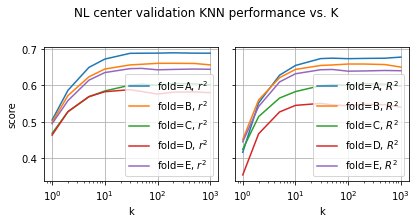

fold A, chosen k: 1000
fold B, chosen k: 200
fold C, chosen k: 1000
fold D, chosen k: 200
fold E, chosen k: 500


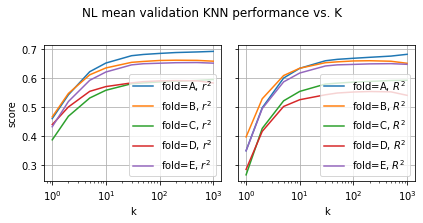

In [36]:
plot_knn_val_performance(nls_center_result, labels, title='NL center')
plot_knn_val_performance(nls_mean_result, labels, title='NL mean')

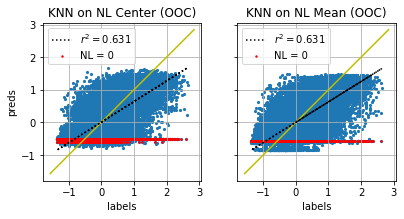

In [37]:
plot_knn_test(nls_center_result, nls_mean_result, labels,
              nl0_center_mask, nl0_mean_mask, title='OOC')

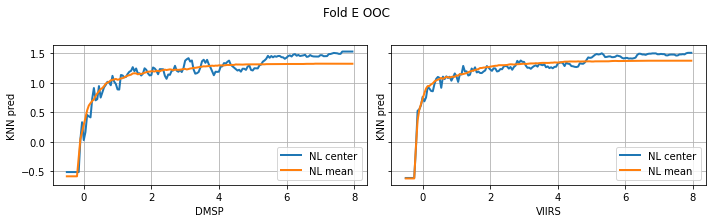

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
for result, title in [(nls_center_result, 'NL center'),
                      (nls_mean_result, 'NL mean')]:
    models = result[0]
    masks = [dmsp_mask, viirs_mask]
    for i in range(2):
        ax, mask, model = axs[i], masks[i], models[i]
        nls = np.arange(-0.5, 8, 0.05)
        preds = model.predict(nls.reshape(-1, 1))
        ax.plot(nls, preds, linewidth=2, label=title)

axs[0].set(xlabel='DMSP', ylabel='KNN pred')
axs[1].set(xlabel='VIIRS', ylabel='KNN pred')

for ax in axs:
    ax.grid(True)
    ax.legend()
fig.suptitle('Fold E OOC', y=1.02)
fig.tight_layout()
plt.show()

### OOC Keep

In [39]:
for k in [0.05, 0.1, 0.25, 0.5]:
    for s in [123, 456, 789]:
        print(f'== keep: {k}, seed: {s} == ')
        filename = f'test_preds_keep{k}_seed{s}.npz'
        knn_cv_wrapper(
            labels=labels, years=years, nls=nls_center, folds=ooc_folds,
            keep=k, seed=s,
            savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_knn', 'nls_center', filename))

        knn_cv_wrapper(
            labels=labels, years=years, nls=nls_mean, folds=ooc_folds,
            keep=k, seed=s,
            savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_knn', 'nls_mean', filename))

== keep: 0.05, seed: 123 == 
test preds	- r^2: 0.627, R^2: 0.625, mse: 0.257, rank: 0.711
test preds	- r^2: 0.628, R^2: 0.625, mse: 0.256, rank: 0.730
== keep: 0.05, seed: 456 == 
test preds	- r^2: 0.626, R^2: 0.624, mse: 0.257, rank: 0.702
test preds	- r^2: 0.624, R^2: 0.622, mse: 0.259, rank: 0.728
== keep: 0.05, seed: 789 == 
test preds	- r^2: 0.623, R^2: 0.621, mse: 0.260, rank: 0.707
test preds	- r^2: 0.620, R^2: 0.618, mse: 0.262, rank: 0.723
== keep: 0.1, seed: 123 == 
test preds	- r^2: 0.626, R^2: 0.625, mse: 0.257, rank: 0.711
test preds	- r^2: 0.628, R^2: 0.627, mse: 0.256, rank: 0.730
== keep: 0.1, seed: 456 == 
test preds	- r^2: 0.626, R^2: 0.624, mse: 0.257, rank: 0.705
test preds	- r^2: 0.627, R^2: 0.625, mse: 0.257, rank: 0.730
== keep: 0.1, seed: 789 == 
test preds	- r^2: 0.626, R^2: 0.624, mse: 0.258, rank: 0.709
test preds	- r^2: 0.624, R^2: 0.623, mse: 0.258, rank: 0.729
== keep: 0.25, seed: 123 == 
test preds	- r^2: 0.627, R^2: 0.626, mse: 0.256, rank: 0.712
test pr

### Incountry

In [40]:
nls_center_result = knn_cv_wrapper(
    labels=labels, years=years, nls=nls_center, folds=incountry_folds,
    savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_knn', 'incountry_nls_center', 'test_preds.npz'))

nls_mean_result = knn_cv_wrapper(
    labels=labels, years=years, nls=nls_mean, folds=incountry_folds,
    savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_knn', 'incountry_nls_mean', 'test_preds.npz'))

test preds	- r^2: 0.634, R^2: 0.634, mse: 0.250, rank: 0.716
test preds	- r^2: 0.638, R^2: 0.638, mse: 0.248, rank: 0.740


fold A, chosen k: 200
fold B, chosen k: 30
fold C, chosen k: 30
fold D, chosen k: 200
fold E, chosen k: 500


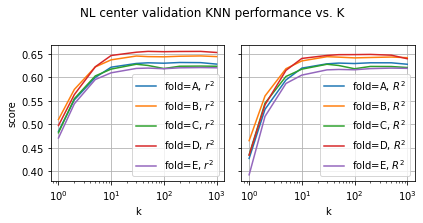

fold A, chosen k: 500
fold B, chosen k: 1000
fold C, chosen k: 500
fold D, chosen k: 200
fold E, chosen k: 500


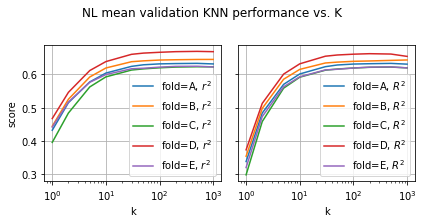

In [41]:
plot_knn_val_performance(nls_center_result, labels, title='NL center')
plot_knn_val_performance(nls_mean_result, labels, title='NL mean')

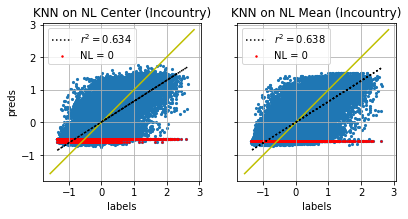

In [42]:
plot_knn_test(nls_center_result, nls_mean_result, labels,
              nl0_center_mask, nl0_mean_mask, title='Incountry')

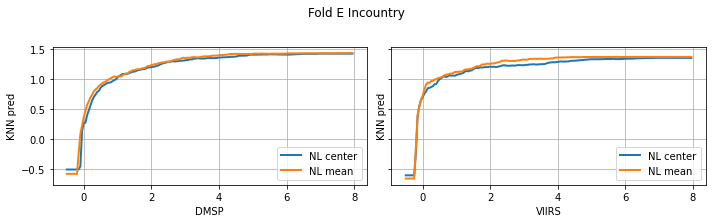

In [43]:
fig, axs = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
for result, title in [(nls_center_result, 'NL center'),
                      (nls_mean_result, 'NL mean')]:
    models = result[0]
    masks = [dmsp_mask, viirs_mask]
    for i in range(2):
        ax, mask, model = axs[i], masks[i], models[i]
        nls = np.arange(-0.5, 8, 0.05)
        preds = model.predict(nls.reshape(-1, 1))
        ax.plot(nls, preds, linewidth=2, label=title)

axs[0].set(xlabel='DMSP', ylabel='KNN pred')
axs[1].set(xlabel='VIIRS', ylabel='KNN pred')

for ax in axs:
    ax.grid(True)
    ax.legend()
fig.suptitle('Fold E Incountry', y=1.02)
fig.tight_layout()
plt.show()

## GBT on NL

As with the KNN section above, this section uses leave-one-fold-out OOC training, which is not directly comparable to our other leave-one-country-out OOC results.

In [44]:
def gbt_nl(labels, years, nls_center, train_idxs, test_idxs, max_depth, lr):
    '''
    Args
    - labels: np.array, shape [N]
    - years: np.array, shape [N]
    - nls_center: np.array, shape [N]
    - splits: dict, split (str) => np.array
    - max_depth: int
    - lr: float, learning rate
    '''
    train_nls = nls_center[train_idxs]

    # test
    test_nls = nls_center[test_idxs]
    test_labels = labels[test_idxs]
    preds = np.zeros_like(test_labels)

    params = {
        'n_estimators': 50,
        'max_depth': max_depth,
        'min_samples_split': 2,
        'learning_rate': lr,
        'loss': 'ls'
    }
    gbt_dmsp = sklearn.ensemble.GradientBoostingRegressor(**params)
    gbt_viirs = sklearn.ensemble.GradientBoostingRegressor(**params)

    dmsp_mask = years < 2012
    viirs_mask = ~dmsp_mask

    for mask, model in [(dmsp_mask, gbt_dmsp), (viirs_mask, gbt_viirs)]:
        train_mask = mask[train_idxs]
        test_mask = mask[test_idxs]

        # assign each unique NL value the same label
        u, indices = np.unique(train_nls[train_mask], return_inverse=True)
        mean_labels = np.zeros_like(u)
        for i, nl in enumerate(u):
            mean_labels[i] = np.mean(labels[nls_center == nl])

        model.fit(X=train_nls[train_mask].reshape(-1, 1), y=mean_labels[indices])
        preds[test_mask] = model.predict(X=test_nls[test_mask].reshape(-1, 1))

    return preds, gbt_dmsp, gbt_viirs

In [45]:
def gbt_cv_wrapper(labels, years, nls, folds, keep=1.0, seed=None, savepath=None, verbose=False):
    '''
    Args
    - labels: np.array, shape [N]
    - years: np.array, shape [N]
    - nls: np.array, shape [N]
    - folds: dict, folds[f][split] is a np.array of indices
    - keep: float, fraction of training and validation data to use
    - seed: int, random seed
    - savepath: str, path to save predictions
    - verbose: bool, whether to print out validation performance on each fold

    Returns
    - best_models: tuple of sklearn.neighbors.KNeighborsRegressor
        best models from the last fold
    - test_preds: np.array, shape [N]
    - ks: np.array, shape [K]
    - r2s: np.array, shape [K]
    - R2s: np.array, shape [K]
    - savepath: str, path to save npz file
    '''
    N = len(labels)
    assert len(years) == N
    assert len(nls) == N
    if savepath is not None:
        assert not os.path.exists(savepath)

    test_preds = np.zeros_like(labels)
    max_depths = [2, 3, 4, 5, 6]
    lrs = [5e-1, 1e-1, 5e-2, 1e-2, 5e-3, 1e-3]
    fold_keys = sorted(folds.keys())
    print(fold_keys)
    r2s = np.zeros([len(fold_keys), len(max_depths), len(lrs)])
    R2s = np.zeros([len(fold_keys), len(max_depths), len(lrs)])

    dmsp_mask = years < 2012
    viirs_mask = ~dmsp_mask

    for i, f in enumerate(fold_keys):
        if verbose:
            print(f'Runing fold {f}...')
        test_idxs = folds[f]['test']
        best_models = None

        for j, d in enumerate(max_depths):
            for k, lr in enumerate(lrs):
                train_idxs = folds[f]['train']
                val_idxs = folds[f]['val']

                if keep < 1:
                    if seed is not None:
                        np.random.seed(seed)
                    num_train = int(len(train_idxs) * keep)
                    num_val = int(len(val_idxs) * keep)
                    if num_train < k or num_val < k:
                        continue
                    train_idxs = np.random.choice(
                        train_idxs, size=num_train, replace=False)
                    val_tfrecord_paths = np.random.choice(
                        val_idxs, size=num_val, replace=False)

                val_preds, gbt_dmsp, gbt_viirs = gbt_nl(
                    labels, years, nls, train_idxs=train_idxs,
                    test_idxs=val_idxs, max_depth=d, lr=lr)
                r2 = calc_score(labels=labels[val_idxs], preds=val_preds, metric='r2')
                R2 = calc_score(labels=labels[val_idxs], preds=val_preds, metric='R2')
                if R2 > np.max(R2s[i]):
                    best_models = (gbt_dmsp, gbt_viirs)
                r2s[i, j, k], R2s[i, j, k] = r2, R2
                if verbose:
                    print(f'fold={f}, depth={d:4d}, lr={lr:0.4f} val_r2={r2:0.4f}, val_R2={R2:0.4f}')

        for i, mask in enumerate([dmsp_mask, viirs_mask]):
            subset_indices = np.intersect1d(np.nonzero(mask)[0], test_idxs)
            test_preds[subset_indices] = best_models[i].predict(nls[subset_indices].reshape(-1, 1))

    evaluate(labels=labels, preds=test_preds, do_print=True, title='test preds')

    if savepath is not None:
        os.makedirs(os.path.dirname(savepath), exist_ok=True)
        np.savez_compressed(savepath, test_preds=test_preds, labels=labels)
        
    return best_models, test_preds, max_depths, lrs, r2s, R2s

def plot_depth_v_lr(depths, lrs, r2s, folds, title=None):
    '''
    Args
    - depths: list of int, length num_depths
    - lrs: list of float, length num_lrs
    - r2s: np.array, shape [num_folds, num_depths, num_lrs]
    - folds: list of str, names of folds
    - title: str
    '''
    lrs, depths = np.meshgrid(lrs, depths)
    lrs = lrs.flatten()
    depths = depths.flatten()

    vmin, vmax = r2s.min(), r2s.max()

    fig, axs = plt.subplots(nrows=1, ncols=len(folds), figsize=[10, 3])
    for i, ax in enumerate(axs):
        f = folds[i]
        j, k = np.nonzero(r2s[i] == np.max(r2s[i]))
        j, k = j[0], k[0]
        d = depths[j]
        lr = lrs[k]
        print(f'fold {f}, chosen depth: {d}, lr: {lr}')
        cax = ax.scatter(x=lrs, y=depths, s=30, c=r2s[i].flatten(), vmin=vmin, vmax=vmax)
        ax.set_title(f'{title}, Fold {f} r^2')

    for ax in axs:
        ax.set_xscale('log')
        ax.set_xlim(left=np.min(lrs)/2, right=np.max(lrs)*2)
        ax.set_xlabel('learning_rate')
        ax.set_ylabel('max_depth')
        ax.grid(True)

    cbar = fig.colorbar(cax)
    fig.tight_layout()
    plt.show()

In [46]:
nls_center_result = gbt_cv_wrapper(
    labels=labels, years=years, nls=nls_center, folds=ooc_folds,
    savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_gbt', 'nls_center', 'test_preds.npz'),
    verbose=True)

nls_mean_result = gbt_cv_wrapper(
    labels=labels, years=years, nls=nls_mean, folds=ooc_folds,
    savepath=os.path.join(LOGS_ROOT_DIR, 'dhs_gbt', 'nls_mean', 'test_preds.npz'),
    verbose=True)

['A', 'B', 'C', 'D', 'E']
Runing fold A...
fold=A, depth=   2, lr=0.5000 val_r2=0.6874, val_R2=0.6708
fold=A, depth=   2, lr=0.1000 val_r2=0.6894, val_R2=0.6740
fold=A, depth=   2, lr=0.0500 val_r2=0.6873, val_R2=0.6677
fold=A, depth=   2, lr=0.0100 val_r2=0.6751, val_R2=0.4139
fold=A, depth=   2, lr=0.0050 val_r2=0.6505, val_R2=0.2546
fold=A, depth=   2, lr=0.0010 val_r2=0.2874, val_R2=0.0574
fold=A, depth=   3, lr=0.5000 val_r2=0.6871, val_R2=0.6698
fold=A, depth=   3, lr=0.1000 val_r2=0.6917, val_R2=0.6757
fold=A, depth=   3, lr=0.0500 val_r2=0.6889, val_R2=0.6691
fold=A, depth=   3, lr=0.0100 val_r2=0.6845, val_R2=0.4220
fold=A, depth=   3, lr=0.0050 val_r2=0.6621, val_R2=0.2597
fold=A, depth=   3, lr=0.0010 val_r2=0.2932, val_R2=0.0585
fold=A, depth=   4, lr=0.5000 val_r2=0.6805, val_R2=0.6633
fold=A, depth=   4, lr=0.1000 val_r2=0.6906, val_R2=0.6747
fold=A, depth=   4, lr=0.0500 val_r2=0.6901, val_R2=0.6703
fold=A, depth=   4, lr=0.0100 val_r2=0.6878, val_R2=0.4260
fold=A, depth

fold=E, depth=   4, lr=0.0010 val_r2=0.2539, val_R2=0.0299
fold=E, depth=   5, lr=0.5000 val_r2=0.6314, val_R2=0.6274
fold=E, depth=   5, lr=0.1000 val_r2=0.6470, val_R2=0.6427
fold=E, depth=   5, lr=0.0500 val_r2=0.6456, val_R2=0.6345
fold=E, depth=   5, lr=0.0100 val_r2=0.6366, val_R2=0.3841
fold=E, depth=   5, lr=0.0050 val_r2=0.6086, val_R2=0.2257
fold=E, depth=   5, lr=0.0010 val_r2=0.2548, val_R2=0.0301
fold=E, depth=   6, lr=0.5000 val_r2=0.6243, val_R2=0.6203
fold=E, depth=   6, lr=0.1000 val_r2=0.6460, val_R2=0.6418
fold=E, depth=   6, lr=0.0500 val_r2=0.6453, val_R2=0.6346
fold=E, depth=   6, lr=0.0100 val_r2=0.6360, val_R2=0.3847
fold=E, depth=   6, lr=0.0050 val_r2=0.6078, val_R2=0.2262
fold=E, depth=   6, lr=0.0010 val_r2=0.2556, val_R2=0.0303
test preds	- r^2: 0.634, R^2: 0.633, mse: 0.251, rank: 0.709
['A', 'B', 'C', 'D', 'E']
Runing fold A...
fold=A, depth=   2, lr=0.5000 val_r2=0.6647, val_R2=0.6493
fold=A, depth=   2, lr=0.1000 val_r2=0.6851, val_R2=0.6690
fold=A, dep

fold=E, depth=   2, lr=0.0100 val_r2=0.6372, val_R2=0.3794
fold=E, depth=   2, lr=0.0050 val_r2=0.5898, val_R2=0.2210
fold=E, depth=   2, lr=0.0010 val_r2=0.2049, val_R2=0.0265
fold=E, depth=   3, lr=0.5000 val_r2=0.6455, val_R2=0.6416
fold=E, depth=   3, lr=0.1000 val_r2=0.6539, val_R2=0.6492
fold=E, depth=   3, lr=0.0500 val_r2=0.6549, val_R2=0.6424
fold=E, depth=   3, lr=0.0100 val_r2=0.6377, val_R2=0.3843
fold=E, depth=   3, lr=0.0050 val_r2=0.5960, val_R2=0.2243
fold=E, depth=   3, lr=0.0010 val_r2=0.2087, val_R2=0.0274
fold=E, depth=   4, lr=0.5000 val_r2=0.6366, val_R2=0.6330
fold=E, depth=   4, lr=0.1000 val_r2=0.6516, val_R2=0.6470
fold=E, depth=   4, lr=0.0500 val_r2=0.6524, val_R2=0.6402
fold=E, depth=   4, lr=0.0100 val_r2=0.6376, val_R2=0.3840
fold=E, depth=   4, lr=0.0050 val_r2=0.5970, val_R2=0.2242
fold=E, depth=   4, lr=0.0010 val_r2=0.2094, val_R2=0.0275
fold=E, depth=   5, lr=0.5000 val_r2=0.6274, val_R2=0.6243
fold=E, depth=   5, lr=0.1000 val_r2=0.6488, val_R2=0.64

fold A, chosen depth: 2, lr: 0.1
fold B, chosen depth: 2, lr: 0.1
fold C, chosen depth: 2, lr: 0.05
fold D, chosen depth: 2, lr: 0.5
fold E, chosen depth: 2, lr: 0.1


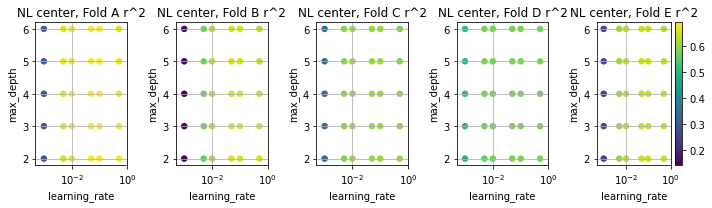

In [47]:
# plot_knn_val_performance(nls_center_result, labels, title='NL center')
# plot_knn_val_performance(nls_mean_result, labels, title='NL mean')

# best_models, test_preds, max_depths, lrs, r2s, R2s = nls_center_result
plot_depth_v_lr(*nls_center_result[2:5], folds=FOLDS, title='NL center')

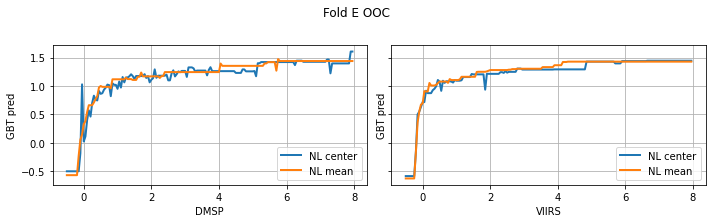

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
for result, title in [(nls_center_result, 'NL center'),
                      (nls_mean_result, 'NL mean')]:
    models = result[0]
    masks = [dmsp_mask, viirs_mask]
    for i in range(2):
        ax, mask, model = axs[i], masks[i], models[i]
        nls = np.arange(-0.5, 8, 0.05)
        preds = model.predict(nls.reshape(-1, 1))
        ax.plot(nls, preds, linewidth=2, label=title)

axs[0].set(xlabel='DMSP', ylabel='GBT pred')
axs[1].set(xlabel='VIIRS', ylabel='GBT pred')

for ax in axs:
    ax.grid(True)
    ax.legend()
fig.suptitle('Fold E OOC', y=1.02)
fig.tight_layout()
plt.show()

# Ridge Regression on Histograms

- set "missing" DMSP and VIIRS values to 0 (i.e. the mean)
- not sure if this is the most "correct" thing to do, but it's somewhat reasonable approximation

In [49]:
# standardize to 0 mean and unit variance
num_examples = len(image_hists)
image_hists_mean = np.mean(image_hists, axis=0, dtype=np.float64)
image_hists_std = np.std(image_hists, axis=0, dtype=np.float64)

image_hists_mean[7] = np.mean(image_hists[dmsp_mask, 7], axis=0, dtype=np.float64)
#image_hists_mean[8] = np.mean(image_hists[viirs_mask, 8], axis=0, dtype=np.float64)

image_hists_std[7] = np.std(image_hists[dmsp_mask, 7], axis=0, dtype=np.float64)
#image_hists_std[8] = np.std(image_hists[viirs_mask, 8], axis=0, dtype=np.float64)

standardized_image_hists = np.zeros(image_hists.shape, dtype=np.float64)
for mask in [dmsp_mask, viirs_mask]:
    standardized_image_hists[mask] = (image_hists[mask] - image_hists_mean) / (image_hists_std + 1e-6)

print(standardized_image_hists.shape)

(36182, 8, 102)


In [50]:
def split_nls(nls, years):
    '''
    Args
    - nls: np.array, shape [N]
    - years: np.array, shape [N]

    Returns
    - nls_split: np.array, shape [N, 2]
    '''
    N = len(nls)
    dmsp_mask = years < 2012
    viirs_mask = ~dmsp_mask
    nls_split = np.zeros([N, 2], dtype=np.float32)
    nls_split[dmsp_mask, 0] = nls[dmsp_mask]
    nls_split[viirs_mask, 1] = nls[viirs_mask]
    return nls_split

In [51]:
standardized_nls_center = split_nls(nls_center, years)
for i, mask in enumerate([dmsp_mask, viirs_mask]):
    standardized_nls_center[mask, i] -= np.mean(standardized_nls_center[mask, i])
    standardized_nls_center[mask, i] -= np.std(standardized_nls_center[mask, i])

standardized_nls_mean = split_nls(nls_mean, years)
for i, mask in enumerate([dmsp_mask, viirs_mask]):
    standardized_nls_mean[mask, i] -= np.mean(standardized_nls_mean[mask, i])
    standardized_nls_mean[mask, i] -= np.std(standardized_nls_mean[mask, i])

## OOC

In [52]:
pays=["angola", "benin", "burkina_faso", "cameroon", "cote_d_ivoire",
        "democratic_republic_of_congo", "ethiopia", "ghana", "guinea", "kenya",
        "lesotho", "malawi", "mali", 
        "mozambique", "nigeria", "madagascar",
        "rwanda", "senegal", "sierra_leone",
        "tanzania","togo","uganda","zambia","zimbabwe"]

In [53]:
def ridge_ooc_wrapper(img_hists, model_name):
    print(model_name)
    ridge_cv(
        features=img_hists.reshape(num_examples, -1),
        labels=labels, group_labels=country_labels, group_names=pays,
        savedir=os.path.join(LOGS_ROOT_DIR, 'dhs_ridge', model_name))
    print(f'== {model_name} urban ==')
    ridge_cv(
        features=img_hists.reshape(num_examples, -1),
        labels=labels, group_labels=country_labels, group_names=pays,
        savedir=os.path.join(LOGS_ROOT_DIR, 'dhs_ridge', model_name),
        subset_indices=urban_indices, subset_name='urban')
    print(f'== {model_name} rural ==')
    ridge_cv(
        features=img_hists.reshape(num_examples, -1),
        labels=labels, group_labels=country_labels, group_names=pays,
        savedir=os.path.join(LOGS_ROOT_DIR, 'dhs_ridge', model_name),
        subset_indices=rural_indices, subset_name='rural')

In [54]:
print(country_labels)

[ 0  0  0 ... 23 23 23]


In [55]:
model_name = 'nlcenter_scalar'
ridge_ooc_wrapper(model_name=model_name, img_hists=standardized_nls_center)

nlcenter_scalar
Group: angola
best val mse: 0.474, best alpha: 128.0, test mse: 1.829
Group: benin
best val mse: 0.517, best alpha: 1024.0, test mse: 0.325
Group: burkina_faso
best val mse: 0.513, best alpha: 1024.0, test mse: 0.411
Group: cameroon
best val mse: 0.506, best alpha: 1024.0, test mse: 0.678
Group: cote_d_ivoire
best val mse: 0.509, best alpha: 1024.0, test mse: 0.666
Group: democratic_republic_of_congo
best val mse: 0.508, best alpha: 1024.0, test mse: 0.681
Group: ethiopia
best val mse: 0.504, best alpha: 1024.0, test mse: 0.654
Group: ghana
best val mse: 0.509, best alpha: 1024.0, test mse: 0.587
Group: guinea
best val mse: 0.508, best alpha: 1024.0, test mse: 0.591
Group: kenya
best val mse: 0.517, best alpha: 1024.0, test mse: 0.440
Group: lesotho
best val mse: 0.515, best alpha: 1024.0, test mse: 0.309
Group: malawi
best val mse: 0.519, best alpha: 1024.0, test mse: 0.377
Group: mali
best val mse: 0.519, best alpha: 1024.0, test mse: 0.292
Group: mozambique
best val 

In [56]:
print(num_examples)

36182


In [57]:
model_name = 'nlmean_scalar'
ridge_ooc_wrapper(model_name=model_name, img_hists=standardized_nls_mean)

nlmean_scalar
Group: angola
best val mse: 0.476, best alpha: 128.0, test mse: 1.817
Group: benin
best val mse: 0.520, best alpha: 1024.0, test mse: 0.308
Group: burkina_faso
best val mse: 0.515, best alpha: 1024.0, test mse: 0.407
Group: cameroon
best val mse: 0.507, best alpha: 1024.0, test mse: 0.675
Group: cote_d_ivoire
best val mse: 0.511, best alpha: 1024.0, test mse: 0.645
Group: democratic_republic_of_congo
best val mse: 0.509, best alpha: 1024.0, test mse: 0.710
Group: ethiopia
best val mse: 0.506, best alpha: 1024.0, test mse: 0.659
Group: ghana
best val mse: 0.510, best alpha: 1024.0, test mse: 0.602
Group: guinea
best val mse: 0.510, best alpha: 1024.0, test mse: 0.612
Group: kenya
best val mse: 0.519, best alpha: 1024.0, test mse: 0.436
Group: lesotho
best val mse: 0.516, best alpha: 1024.0, test mse: 0.314
Group: malawi
best val mse: 0.521, best alpha: 1024.0, test mse: 0.386
Group: mali
best val mse: 0.521, best alpha: 1024.0, test mse: 0.297
Group: mozambique
best val ms

In [58]:
model_name = 'rgb_hist'
ridge_ooc_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, :3, :])

rgb_hist
Group: angola
best val mse: 0.569, best alpha: 1024.0, test mse: 0.808
Group: benin
best val mse: 0.585, best alpha: 1024.0, test mse: 0.312
Group: burkina_faso
best val mse: 0.578, best alpha: 1024.0, test mse: 0.613
Group: cameroon
best val mse: 0.575, best alpha: 1024.0, test mse: 0.630
Group: cote_d_ivoire
best val mse: 0.575, best alpha: 1024.0, test mse: 0.560
Group: democratic_republic_of_congo
best val mse: 0.576, best alpha: 1024.0, test mse: 0.513
Group: ethiopia
best val mse: 0.564, best alpha: 1024.0, test mse: 0.837
Group: ghana
best val mse: 0.576, best alpha: 8192.0, test mse: 0.705
Group: guinea
best val mse: 0.576, best alpha: 1024.0, test mse: 0.495
Group: kenya
best val mse: 0.564, best alpha: 1024.0, test mse: 0.694
Group: lesotho
best val mse: 0.582, best alpha: 1024.0, test mse: 0.268
Group: malawi
best val mse: 0.587, best alpha: 1024.0, test mse: 0.414
Group: mali
best val mse: 0.580, best alpha: 1024.0, test mse: 0.589
Group: mozambique
best val mse: 0

In [59]:
model_name = 'rgbnl_hist'
bands = [0, 1, 2, -2, -1]
ridge_ooc_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, bands, :])

rgbnl_hist
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31447e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21106e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08217e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04676e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17218e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.83568e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13054e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.67931e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.99563e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.83051e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70362e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66208e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89217e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73698e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67928e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28793e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24272e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23948e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37133e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24438e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71622e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50024e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47449e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45857e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44774e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4972e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46641e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54945e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41874e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78e-20): result ma

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02845e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96327e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93459e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07048e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97131e-18): resul

best val mse: 0.290, best alpha: 8192.0, test mse: 0.367
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31447e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37461e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.23192e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.20275e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33829e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96892e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.2844e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.80725e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1339e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96332e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78743e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74176e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.97718e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.82338e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76066e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34354e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29354e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29216e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43381e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29698e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74257e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50024e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49168e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4689e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46168e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51327e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58311e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44629e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81442e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48635e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00589e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97493e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1143e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01521e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98532e-18): result

best val mse: 0.294, best alpha: 8192.0, test mse: 0.178
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21106e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37461e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.13762e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.10214e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22986e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.88311e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.18335e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.72434e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.04554e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.87785e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73259e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69083e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92291e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76692e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70822e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30878e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26159e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25977e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39422e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26419e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71549e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47449e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49168e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44692e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43822e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51454e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49708e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5634e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43094e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78153e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04919e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98329e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95367e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09243e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99129e-18): resul

best val mse: 0.289, best alpha: 8192.0, test mse: 0.331
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08217e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.23192e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.13762e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.9766e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09464e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.77645e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.05821e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.62097e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.93606e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.77161e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66654e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.62944e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.8588e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6985e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6446e-25): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26287e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21905e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21599e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34071e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21998e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67811e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45857e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4689e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44692e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41906e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48504e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45246e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53472e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40755e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7754e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00645e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94425e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91771e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05358e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95155e-18): resul

best val mse: 0.286, best alpha: 8192.0, test mse: 0.396
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04676e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.20275e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.10214e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.9766e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06465e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.74649e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03252e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.5949e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.90138e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.74148e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.64717e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.60715e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.82865e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67987e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.62377e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25649e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21203e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20971e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33805e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2139e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68174e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44774e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46168e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43822e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41906e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4724e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68061e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5239e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39722e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74027e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99535e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93186e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90411e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03547e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93973e-18): resul

best val mse: 0.289, best alpha: 8192.0, test mse: 0.373
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17218e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33829e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22986e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09464e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06465e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.85058e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.15156e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.69471e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.00961e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.84525e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71278e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6696e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89636e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74709e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68742e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29947e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2509e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24959e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38488e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25414e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7108e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46856e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4852e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46033e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4388e-21): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70567e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55564e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64348e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76666e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46201e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96647e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93689e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07154e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97508e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94676e-18): resul

best val mse: 0.291, best alpha: 8192.0, test mse: 0.236
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.3009e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.46632e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.36022e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2283e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18915e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.958e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.26399e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.79457e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.12555e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.95268e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.77931e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73747e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.97646e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81421e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75471e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28304e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27993e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41406e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28473e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40875e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49693e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51198e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48757e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46704e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45758e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52141e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5885e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45247e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81547e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49332e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00654e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97722e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11946e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01502e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98674e-18): resul

best val mse: 0.290, best alpha: 8192.0, test mse: 0.324
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.14025e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.29561e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1968e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.07379e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.03315e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.8245e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11399e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.66741e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.98557e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81948e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69599e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.65668e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88721e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.72869e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67285e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2509e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28304e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23435e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36267e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23821e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70164e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47313e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48532e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46153e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44385e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4966e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48621e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54888e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41902e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77856e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02448e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96038e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9328e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06976e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96812e-18): result

best val mse: 0.289, best alpha: 8192.0, test mse: 0.318
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.11671e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.27456e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17311e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04664e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.01053e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.80472e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.09551e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.64972e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.9633e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.79965e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68418e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.64378e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.87086e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71715e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66038e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24959e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27993e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23435e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36244e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23572e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69598e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45782e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47275e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44938e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42938e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49351e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46234e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54651e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41674e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.767e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01696e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95231e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92439e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05878e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96038e-18): resul

best val mse: 0.290, best alpha: 8192.0, test mse: 0.275
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.56707e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.75611e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.63156e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.47714e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.44763e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17926e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.51973e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.00657e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.35571e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1732e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.8694e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12072e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9576e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88996e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.99345e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36267e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36244e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3668e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50269e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41083e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53807e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5131e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50559e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53173e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55911e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88023e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56286e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53424e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95043e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99267e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09215e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05968e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12647e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08656e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20258e-18): resul

best val mse: 0.288, best alpha: 8192.0, test mse: 0.316
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1296e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.28889e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18626e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.05833e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.02308e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81539e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.10809e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.66007e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97424e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81027e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69091e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.64995e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.87736e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.72407e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66678e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25414e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28473e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23821e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23572e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3668e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7021e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46639e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48137e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45824e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43758e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48697e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69042e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76906e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62864e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75163e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01938e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9546e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92628e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06097e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96266e-18): result

best val mse: 0.291, best alpha: 8192.0, test mse: 0.248
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.51888e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.70149e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.58227e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.43434e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.40077e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.47136e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96778e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.31476e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1334e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.02482e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84742e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09855e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.93254e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86705e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96845e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40875e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35667e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35481e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50269e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35962e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53764e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55642e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52971e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50632e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49769e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57436e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64745e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50085e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8649e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54433e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06815e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03678e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18329e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07865e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04615e-18): resul

best val mse: 0.294, best alpha: 8192.0, test mse: 0.237
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.26021e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.42457e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31892e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18745e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.14974e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.924e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.22714e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.76263e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.0893e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.91871e-27): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89498e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71563e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.95119e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79195e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73292e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29398e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32595e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27772e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27551e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41083e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73245e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49373e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50985e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48682e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4643e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77457e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74823e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83106e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68286e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81409e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9546e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06815e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97176e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11384e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00968e-18): result

best val mse: 0.295, best alpha: 1024.0, test mse: 0.256
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17765e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33318e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2347e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.11221e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06934e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.85572e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14702e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.69651e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.01914e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.85069e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71563e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9108e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74837e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69243e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78188e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29474e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24949e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24643e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3763e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2503e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47745e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49105e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46805e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44947e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43907e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48397e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56509e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43283e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7954e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47303e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03678e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97176e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08324e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97989e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95366e-18): resul

best val mse: 0.292, best alpha: 8192.0, test mse: 0.259
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.63157e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80023e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69564e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.56673e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.50868e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.55874e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.05181e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.42327e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.22891e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.12382e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9108e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.98806e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92753e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.02502e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.97362e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38236e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38392e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52413e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38735e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52092e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61422e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58824e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56871e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55598e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57861e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68337e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53393e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9551e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57978e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55229e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08324e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12164e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09217e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16012e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11663e-18): resul

best val mse: 0.264, best alpha: 1024.0, test mse: 0.485
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.32303e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.49224e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.3829e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2469e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21076e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.9763e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.28683e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81266e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14385e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97087e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.93254e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79195e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74837e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.98806e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76631e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31455e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34675e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29758e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29513e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43395e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74915e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5097e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52592e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50098e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4793e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53582e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52395e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59203e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45468e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82509e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96266e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07865e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00968e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97989e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12164e-18): resul

best val mse: 0.292, best alpha: 8192.0, test mse: 0.257
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.20893e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.3683e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.26663e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.14015e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09984e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.8816e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17786e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.72174e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.04552e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.87647e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86705e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73292e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69243e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92753e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76631e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27828e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31055e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26334e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26061e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39311e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71921e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48131e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49626e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4731e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45359e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51672e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50782e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57057e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43749e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80476e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93556e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04615e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98115e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95366e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09217e-18): resul

best val mse: 0.296, best alpha: 8192.0, test mse: 0.174
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.39114e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.56206e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.45201e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31535e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.27669e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03301e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.34822e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.86587e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.20438e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.02752e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96845e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.82564e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78188e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.02502e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86143e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36457e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3133e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31111e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45263e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31625e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5325e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54198e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51703e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49737e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48633e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55221e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62242e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48156e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.84742e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52348e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11121e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.0438e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.012e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16012e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05164e-18): result m

best val mse: 0.278, best alpha: 1024.0, test mse: 0.405
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.29499e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.46155e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.3543e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22094e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1835e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03301e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25982e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.79026e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11975e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94767e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91638e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7775e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73489e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.97362e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81213e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30331e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3354e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28668e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28443e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4215e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73666e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50138e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51786e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49271e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47155e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50782e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55221e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60977e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69099e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82424e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9581e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07371e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00459e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97581e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11663e-18): result

best val mse: 0.295, best alpha: 8192.0, test mse: 0.200
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.66362e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.85594e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72966e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.5732e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.54107e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.34822e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25982e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.08226e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.44153e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25365e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12732e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96955e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91989e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1787e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.00933e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41604e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44853e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39336e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39338e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54709e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81597e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57516e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59529e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56656e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54131e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57057e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62242e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60977e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53397e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91214e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05779e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18572e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10872e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07502e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22828e-18): resul

best val mse: 0.296, best alpha: 1024.0, test mse: 0.213
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.0995e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.25944e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.15583e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.02657e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.99399e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.86587e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.79026e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.08226e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94698e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.78513e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80739e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67495e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6336e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85765e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70816e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24484e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2744e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22809e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22609e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35722e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69194e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45353e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46876e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44505e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42456e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43749e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48156e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69099e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53397e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75158e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90202e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01123e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94648e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91798e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05086e-18): resul

best val mse: 0.292, best alpha: 8192.0, test mse: 0.140
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.49494e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.66779e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.55736e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.42045e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37711e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.20438e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11975e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.44153e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94698e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1142e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88302e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83916e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09425e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91919e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85706e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34977e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34691e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49068e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35143e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.48265e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53287e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51167e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50031e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52465e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55489e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91214e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75158e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81428e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77907e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96031e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03849e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18812e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.0778e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04815e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11125e-18): result

best val mse: 0.299, best alpha: 8192.0, test mse: 0.182
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.28857e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.45457e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.34777e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21493e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17726e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.02752e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94767e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25365e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.78513e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1142e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.77295e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73043e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96869e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80788e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74814e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33037e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28002e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27915e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41511e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28312e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51021e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48591e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46561e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45595e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47864e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57901e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44351e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81428e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45809e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86241e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11179e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00881e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98067e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04153e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00417e-18): resul

best val mse: 0.291, best alpha: 1024.0, test mse: 0.284
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.16771e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.32517e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22475e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09974e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.05985e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.92452e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.8473e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13995e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.68926e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.0093e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84362e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71103e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67112e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.90324e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74404e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29585e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24972e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24693e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37812e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25134e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47162e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48712e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46408e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44451e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43445e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49653e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48509e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54891e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41885e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77907e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03091e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96606e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93835e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07567e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97409e-18): resul

best val mse: 0.288, best alpha: 8192.0, test mse: 0.355
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/rgbnl_hist/test_preds.npz
== rgbnl_hist urban ==
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.79213e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19427e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18248e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16195e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.33512e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.47743e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50052e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3352e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43648e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.46574e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17616e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12973e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21283e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20398e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21822e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3146e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30011e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29508e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3931e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32485e-22): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08519e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03997e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15874e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02977e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05251e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51205e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32758e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32661e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31348e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36696e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17356e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20986e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2199e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17904e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09639e-16): result

best val mse: 0.321, best alpha: 1024.0, test mse: 0.286
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.69792e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68375e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.91597e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25333e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94619e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75522e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88209e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92333e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76893e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06108e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39805e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.503e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49512e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51414e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38033e-24): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46351e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45904e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58172e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49946e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.462e-22): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21013e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15686e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31573e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14429e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17374e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51205e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49007e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48522e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47323e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54501e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32057e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3664e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38017e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32571e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09639e-16): result

best val mse: 0.322, best alpha: 1024.0, test mse: 0.231
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13025e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11032e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27919e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.53087e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30948e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29374e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39246e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42099e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3082e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67906e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10157e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18143e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17412e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1881e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08744e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27308e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29932e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28474e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28265e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37881e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00688e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04701e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11168e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05574e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01522e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1184e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32758e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49007e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30968e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29682e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2148e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20873e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21636e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15895e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19474e-17): result

best val mse: 0.315, best alpha: 1024.0, test mse: 0.527
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13025e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09862e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26314e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5125e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29624e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41026e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3001e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67134e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00068e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63781e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16723e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18132e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08151e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14393e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1594e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27204e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26787e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36142e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29587e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26958e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01033e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12229e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00276e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02539e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04232e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29604e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34687e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43172e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36349e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30791e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16186e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.56974e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07488e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.45065e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.37715e-17): resul

best val mse: 0.320, best alpha: 1024.0, test mse: 0.345
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68375e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11032e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09862e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24585e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.49353e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36609e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39425e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28304e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65862e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99189e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16419e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15774e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17176e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07231e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13369e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27027e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36362e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29804e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27071e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31677e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11856e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.96023e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01785e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02064e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02286e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3347e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41842e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34997e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2951e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44866e-18): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52208e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07151e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40395e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.37715e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.71314e-17): resul

best val mse: 0.321, best alpha: 8192.0, test mse: 0.338
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27919e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26314e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24585e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.70093e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.45926e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.53942e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41664e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76914e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14025e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73318e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25029e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26546e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15717e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2234e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24161e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42475e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35416e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32455e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37511e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37189e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03573e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05958e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06095e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0634e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12944e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48259e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4068e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34727e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51723e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33425e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79013e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.75343e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.71314e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0755e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02022e-16): result

best val mse: 0.318, best alpha: 1024.0, test mse: 0.350
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.53087e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5125e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.49353e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.70093e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.73336e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71934e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75521e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.61702e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93381e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35524e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35424e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29841e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39424e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38603e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40341e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41599e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39816e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39428e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50399e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42936e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10049e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15018e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15932e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1108e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25033e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22758e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45457e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6579e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43437e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43172e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33665e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26741e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30951e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32183e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27305e-17): resul

best val mse: 0.316, best alpha: 1024.0, test mse: 0.382
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30948e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29624e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27542e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.45926e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.73336e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5644e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4417e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78864e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15917e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75217e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26478e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27965e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17081e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23815e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25607e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42501e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35925e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3295e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38063e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37719e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04402e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06784e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07014e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0729e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13878e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4068e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49957e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36282e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53351e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34948e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.86041e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.83009e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78177e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02022e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08303e-16): resul

best val mse: 0.323, best alpha: 1024.0, test mse: 0.258
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14408e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13221e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11255e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28188e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.53392e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42306e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30997e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68064e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01993e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64685e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17594e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19002e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08908e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1515e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16793e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37681e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31077e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2833e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33078e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32666e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00438e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0266e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02929e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03207e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09171e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34727e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43247e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36282e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46262e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29458e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16448e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60148e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08158e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.48139e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4541e-17): result

best val mse: 0.318, best alpha: 1024.0, test mse: 0.312
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.62553e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.6031e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.58688e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.80684e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.12832e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67711e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79905e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83767e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69136e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99599e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55359e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40541e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34656e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44676e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43879e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48267e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42328e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41075e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44478e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4249e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31573e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12804e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12229e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11856e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17228e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3154e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26406e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48596e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70782e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46534e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30416e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36377e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35643e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36657e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29399e-17): resul

best val mse: 0.320, best alpha: 1024.0, test mse: 0.302
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68827e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11327e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10135e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08222e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24922e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36855e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39684e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28533e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66051e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99485e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16662e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15951e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17345e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07394e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13547e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27129e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36493e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29986e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27232e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31878e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00438e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11966e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01641e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01896e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02112e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2829e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33425e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41802e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34948e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29458e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52878e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07252e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.41049e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.38317e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.33877e-17): resul

best val mse: 0.318, best alpha: 1024.0, test mse: 0.304
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20725e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19417e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17483e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.35038e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.61094e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.34569e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44734e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.47722e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36007e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72195e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21742e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2101e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22463e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12053e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18473e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30188e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29913e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39605e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3268e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29882e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05958e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12598e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06784e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0266e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14868e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34843e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51814e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33088e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33007e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31715e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17711e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21402e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22386e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18247e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.75004e-17): resul

best val mse: 0.315, best alpha: 1024.0, test mse: 0.400
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13605e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12583e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10453e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27159e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.52218e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28888e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.38758e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41562e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30391e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67451e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09822e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17828e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17045e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18433e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08409e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4249e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27541e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30188e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28533e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37949e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06095e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12681e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07014e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02929e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14387e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49038e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31261e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3118e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29851e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35019e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19352e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20276e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1633e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58388e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07814e-16): result

best val mse: 0.321, best alpha: 1024.0, test mse: 0.262
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1586e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14927e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12663e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29459e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.54787e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43467e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.32233e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68967e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02623e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65558e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18124e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19532e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09435e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1574e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17332e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37715e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30865e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28132e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32832e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32508e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14784e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02112e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04431e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04783e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09661e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35836e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44452e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37489e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31837e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47345e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.51565e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49411e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.44186e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.82598e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04065e-16): resul

best val mse: 0.313, best alpha: 1024.0, test mse: 0.427
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.47988e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.4513e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.64567e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94334e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68531e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68413e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7163e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5862e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90515e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29884e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32562e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27332e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36583e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35838e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37358e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37681e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53645e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36493e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39605e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37949e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08194e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12944e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20135e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13878e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09171e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45712e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64847e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43717e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43708e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42049e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25755e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2999e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31062e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26461e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04144e-16): result

best val mse: 0.316, best alpha: 1024.0, test mse: 0.335
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.23757e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.2236e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20473e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.38352e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.64828e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36973e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.47274e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50328e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.384e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7417e-25): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15015e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23338e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22638e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24092e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13547e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3268e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31191e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30865e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40849e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30967e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08211e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03976e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15972e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02949e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05295e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33569e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32297e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37805e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46737e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39369e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19037e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.82064e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6951e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66314e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61928e-17): result

best val mse: 0.320, best alpha: 1024.0, test mse: 0.264
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14668e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1349e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1151e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28454e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5369e-27): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42525e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.31209e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68241e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02192e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64852e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17728e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19129e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09035e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15282e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1693e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29882e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28525e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28132e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37597e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30967e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04958e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11468e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0582e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01777e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13174e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49099e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31086e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31033e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29736e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34961e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19595e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20542e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16545e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6078e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08231e-16): result

best val mse: 0.321, best alpha: 1024.0, test mse: 0.211
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30716e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29457e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27308e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.45614e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.72976e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42435e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.53115e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.56211e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43992e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78701e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18885e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36583e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23338e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18449e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26322e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38063e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33078e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48208e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31878e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34719e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19886e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04482e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04216e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03657e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08096e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2475e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17714e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23229e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22942e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18585e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2136e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22024e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32353e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24329e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21587e-17): result

best val mse: 0.317, best alpha: 1024.0, test mse: 0.325
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29166e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27813e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.25792e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.44063e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71244e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.54931e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42738e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77711e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14519e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74091e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17728e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26322e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27051e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16219e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22904e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34489e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32947e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32508e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42665e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35591e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10936e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06534e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19104e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05421e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07865e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35472e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34616e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40271e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49468e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41907e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20661e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.94822e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81981e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78861e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.74151e-17): resul

best val mse: 0.327, best alpha: 1024.0, test mse: 0.157
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.31981e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30583e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28566e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.47112e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.74684e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57346e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44972e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79554e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16952e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75879e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27798e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27051e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1761e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24367e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2619e-24): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33027e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43162e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36101e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33111e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38185e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1845e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04843e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07281e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07459e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07747e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40962e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50277e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42601e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36515e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54145e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88392e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.85237e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.80506e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02292e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0861e-16): result

best val mse: 0.321, best alpha: 1024.0, test mse: 0.263
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11826e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10617e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08714e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.25468e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.50348e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40114e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28928e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6638e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99923e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63044e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16924e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16219e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1761e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13801e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15439e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27395e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36717e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30153e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27436e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32092e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12137e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.96573e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0184e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02096e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02319e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33684e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42089e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35209e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29701e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4515e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07411e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.42204e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.3948e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.35017e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.73328e-17): result

best val mse: 0.321, best alpha: 1024.0, test mse: 0.091
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.2417e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.22982e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20863e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.38566e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.65039e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.37273e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50627e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.38801e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74465e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10051e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33057e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20043e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15282e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23655e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22904e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30063e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32809e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31377e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31027e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40977e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13797e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07831e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03716e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15519e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02657e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34517e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34003e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33099e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38575e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47554e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23411e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19278e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.83104e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70557e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.67813e-17): resul

best val mse: 0.322, best alpha: 1024.0, test mse: 0.252
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27745e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.264e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24393e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.42542e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.69531e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50627e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41604e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76762e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13306e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73159e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1693e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2544e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24677e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2619e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15439e-24): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31166e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34033e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32611e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32199e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42312e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16069e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0996e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05641e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18076e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04544e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3473e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33731e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39331e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48437e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40943e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20197e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.91465e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78666e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.75587e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70931e-17): resul

best val mse: 0.311, best alpha: 1024.0, test mse: 0.471
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13635e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1262e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1048e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27184e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.52246e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44972e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28928e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.38801e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41604e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67559e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10416e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26838e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14427e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09934e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17881e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4182e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26945e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29599e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28272e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27938e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04348e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10777e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0524e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01227e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12424e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4836e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30613e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30607e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29273e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34417e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15694e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19278e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20197e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58344e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07807e-16): resul

best val mse: 0.313, best alpha: 1024.0, test mse: 0.429
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/rgbnl_hist/test_preds_urban.npz
== rgbnl_hist rural ==
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55977e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58818e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.38991e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32566e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46514e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73331e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.15004e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.51863e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.07273e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73105e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.89479e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83584e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.13824e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95335e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90114e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94745e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8961e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89444e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02838e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90649e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31401e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47978e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43896e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.84061e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37442e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14926e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09489e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23424e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03167e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25209e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76054e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66165e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61964e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80693e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67937e-18): resul

best val mse: 0.232, best alpha: 1024.0, test mse: 0.309
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70258e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49501e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43424e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57935e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.76483e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.25769e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.60772e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.16987e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.8233e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.71561e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.89137e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.19663e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01294e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95751e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01661e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9297e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92775e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06735e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94057e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10871e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47978e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.5115e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87005e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44493e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47627e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11801e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26173e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05376e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29968e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11527e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69337e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64939e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83951e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71151e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68351e-18): resul

best val mse: 0.236, best alpha: 1024.0, test mse: 0.176
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70258e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52966e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46208e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60511e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79969e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27947e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.62923e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.202e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.84857e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.7421e-27): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90747e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.21896e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0282e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9749e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.03106e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93551e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93175e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.069e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94385e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11285e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43896e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.5115e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4765e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40543e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4358e-21): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14028e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28155e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07214e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32337e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13476e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.70947e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66563e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8605e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72724e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.70008e-18): result

best val mse: 0.237, best alpha: 1024.0, test mse: 0.135
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49501e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52966e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.26915e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40147e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60158e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.08778e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.47079e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.03188e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68538e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.58639e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.81321e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11767e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9245e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87766e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92673e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88359e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87663e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00303e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88802e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0474e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.84061e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87005e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4765e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4121e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43967e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.0878e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22313e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02456e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24859e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08507e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64697e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60762e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79734e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66445e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64113e-18): resul

best val mse: 0.229, best alpha: 1024.0, test mse: 0.430
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43424e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46208e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.26915e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34207e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52475e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.03597e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.42163e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.96129e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.62866e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.52769e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.77432e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.06831e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.88769e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83688e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.89105e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86256e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86116e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99028e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87291e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03267e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37442e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44493e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40543e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4121e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37129e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07288e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2051e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00768e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24698e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06658e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62629e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.58539e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76782e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64348e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61805e-18): resul

best val mse: 0.233, best alpha: 1024.0, test mse: 0.279
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57935e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60511e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40147e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34207e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66599e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.16948e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.53282e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.08338e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.74409e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.6385e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.84335e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14258e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9624e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90788e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.96607e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90097e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90015e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0364e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91267e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07805e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40346e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47627e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4358e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43967e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37129e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10676e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.246e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04139e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28621e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10097e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66643e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62332e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80947e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6842e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6568e-18): result 

best val mse: 0.234, best alpha: 1024.0, test mse: 0.195
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.76483e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79969e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60158e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52475e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66599e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.33373e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.67883e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.26914e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.9044e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.79883e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94456e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.26453e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.06344e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01287e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.06629e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95353e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94845e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08034e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9613e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12895e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89066e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92218e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92532e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89143e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87235e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16364e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30107e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08917e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34933e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15357e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72502e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68303e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88276e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74379e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71838e-18): resul

best val mse: 0.230, best alpha: 1024.0, test mse: 0.317
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54628e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58004e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39121e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.31705e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.45179e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.13451e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.50978e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.0742e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72567e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.625e-27): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.8204e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.1391e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94037e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.89291e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94535e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95353e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89713e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02671e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90958e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0703e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.84929e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8796e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88263e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85038e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83194e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10778e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24126e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03933e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28721e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10117e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66166e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62135e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81244e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67927e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65509e-18): resul

best val mse: 0.230, best alpha: 1024.0, test mse: 0.361
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55739e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58777e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39282e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32496e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46278e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.14679e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.51749e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.07559e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73129e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.6286e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83825e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14192e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9539e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90307e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95699e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94845e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89713e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02722e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90692e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07008e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4029e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47382e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43486e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44117e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37027e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10157e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24531e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04179e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26357e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10295e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66218e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6211e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8095e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68013e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65479e-18): result 

best val mse: 0.235, best alpha: 1024.0, test mse: 0.149
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00549e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.008e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.85089e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79108e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.95025e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.6055e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.89889e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.50027e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.12931e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.01135e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.07799e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.40335e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2104e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14827e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.21513e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08034e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02671e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02722e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04057e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22077e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51919e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59731e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55464e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55484e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.48327e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23555e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39406e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16462e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40788e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22993e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80326e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75541e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95847e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82362e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79211e-18): resul

best val mse: 0.233, best alpha: 8192.0, test mse: 0.260
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.59847e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.62878e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43168e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.36381e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.50305e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.18425e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.54911e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.11144e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.76449e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.66077e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85806e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.16215e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97402e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92268e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97711e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9613e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90958e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90692e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04057e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0838e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40683e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47727e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43955e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44461e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37377e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10899e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24109e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03835e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28243e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09865e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67297e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63118e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82128e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69085e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66504e-18): resul

best val mse: 0.234, best alpha: 1024.0, test mse: 0.196
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01752e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02049e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.977e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.90842e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00681e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.71321e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.99313e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.61769e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.23194e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.11323e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14307e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.48355e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2764e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.21564e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28055e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12895e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0703e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07008e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22077e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0838e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55743e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63561e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59387e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59496e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52062e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28862e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41405e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18083e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45896e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25052e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83851e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79272e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00133e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86002e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82875e-18): resul

best val mse: 0.239, best alpha: 1024.0, test mse: 0.175
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.77908e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81052e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60609e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53559e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.68006e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34775e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68815e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27233e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91161e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80403e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94018e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25814e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.06379e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01085e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.06469e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0143e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95935e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95768e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09626e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97042e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47486e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55199e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51219e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51652e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44065e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18308e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32921e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11267e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37042e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17758e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83851e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69298e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8928e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75552e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72794e-18): result

best val mse: 0.237, best alpha: 1024.0, test mse: 0.209
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65551e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.69071e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49871e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.42156e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55882e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.23371e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.59457e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.17388e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.81588e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.71329e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94018e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.1905e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0028e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95449e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.00453e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98505e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93982e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92769e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05941e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93899e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87174e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90285e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90576e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87224e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85405e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13762e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27543e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06836e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30606e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13105e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79272e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69298e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84812e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71165e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68747e-18): resul

best val mse: 0.234, best alpha: 1024.0, test mse: 0.209
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02871e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03346e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01296e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00275e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0177e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.80641e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.08427e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.76226e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34147e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.22887e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25814e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.1905e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.3276e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.27936e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32169e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.17645e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1488e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11667e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.25824e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12943e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9881e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02304e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02667e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99103e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96697e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31862e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47436e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23536e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53078e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30992e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00133e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8928e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84812e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91354e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88844e-18): result

best val mse: 0.204, best alpha: 1024.0, test mse: 0.485
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88605e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.91838e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70987e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.63743e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78486e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.44603e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.77142e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.36926e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.89011e-27): result may 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.06379e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0028e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.3276e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.07226e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.13024e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04799e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99263e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99048e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13018e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00268e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49587e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94045e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53021e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90709e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46105e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18143e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32409e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10725e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36772e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17193e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86002e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75552e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71165e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91354e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74764e-18): resul

best val mse: 0.236, best alpha: 1024.0, test mse: 0.178
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.77427e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81091e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61525e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53503e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.67518e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34166e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68676e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.28218e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91413e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80921e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01085e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95449e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.27936e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.07226e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.07496e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01943e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96331e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96116e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09657e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97348e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46795e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92679e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50182e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89432e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43365e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19764e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30523e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09305e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3605e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15854e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82875e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72794e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68747e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88844e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74764e-18): resul

best val mse: 0.240, best alpha: 1024.0, test mse: 0.127
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78754e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.90653e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.93811e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.7274e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6562e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.01802e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.46496e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.78671e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.38522e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.01558e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28055e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.06469e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.00453e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32169e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.13024e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99006e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04059e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9916e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98437e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12503e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39262e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91627e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94952e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95305e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91558e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21696e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20925e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35794e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13713e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39892e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71024e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88033e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77676e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73052e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9356e-18): result

best val mse: 0.220, best alpha: 1024.0, test mse: 0.369
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78374e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81541e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61117e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54018e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.68462e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.35284e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69241e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.2777e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91634e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80869e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01181e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95208e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.27089e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.07299e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01965e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01723e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96368e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96161e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09993e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97493e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46555e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53823e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49937e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50505e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43128e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20925e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30203e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08693e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35083e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14806e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8328e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72831e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68596e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8828e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74782e-18): result 

best val mse: 0.238, best alpha: 1024.0, test mse: 0.147
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01895e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03241e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03514e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01117e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00469e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.46496e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.35284e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.10667e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.74333e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.35018e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.51688e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28084e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2114e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.55561e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.34787e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11593e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16553e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10696e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10668e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.26152e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.48903e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59986e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68169e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63692e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63653e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30523e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35794e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30203e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22172e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50694e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81049e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99798e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88039e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83038e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04536e-18): resul

best val mse: 0.241, best alpha: 1024.0, test mse: 0.158
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.51127e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53824e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34003e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.27859e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4176e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69241e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.10667e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.02665e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69018e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.58689e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.86974e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.811e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10766e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92757e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87497e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93194e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88102e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87984e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.013e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89186e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38927e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46029e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42083e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42571e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35691e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08693e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22172e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26184e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08076e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05115e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64759e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60552e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79018e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66501e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63861e-18): resul

best val mse: 0.235, best alpha: 1024.0, test mse: 0.138
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02141e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02544e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00415e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.95331e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0106e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.2777e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.74333e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.02665e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27513e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.16069e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.23912e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17742e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.53541e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.3059e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2519e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15092e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09138e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08825e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.23461e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10181e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.58331e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66029e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62107e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62703e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54596e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39892e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35083e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50694e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26184e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31358e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97379e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85904e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81623e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03499e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88199e-18): resul

best val mse: 0.246, best alpha: 1024.0, test mse: 0.118
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78111e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81278e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60864e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.5377e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.68204e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91634e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.35018e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69018e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27513e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80639e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.00363e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94177e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25811e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.065e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01237e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01149e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96338e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95425e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0941e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96593e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88233e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91593e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91847e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88401e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8659e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20319e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14806e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29216e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08076e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31358e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82826e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72527e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68245e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87976e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7443e-18): result

best val mse: 0.236, best alpha: 1024.0, test mse: 0.180
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6462e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6794e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4846e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.41123e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54977e-28): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80869e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.22631e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.58689e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.16069e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80639e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94224e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.88484e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.19741e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.00197e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95187e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97555e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92343e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92037e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05366e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9326e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43237e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50435e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46552e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86411e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39909e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17105e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11881e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25625e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05115e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30175e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78684e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68815e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64686e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84078e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.70633e-18): resul

best val mse: 0.235, best alpha: 1024.0, test mse: 0.201
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/rgbnl_hist/test_preds_rural.npz


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85743e-23): result may not be accurate.
  overwrite_a=True).T


In [60]:
model_name = 'ms_hist'
ridge_ooc_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, :7, :])

ms_hist
Group: angola
best val mse: 0.511, best alpha: 1024.0, test mse: 0.473
Group: benin
best val mse: 0.515, best alpha: 1024.0, test mse: 0.282
Group: burkina_faso
best val mse: 0.512, best alpha: 1024.0, test mse: 0.427
Group: cameroon
best val mse: 0.507, best alpha: 1024.0, test mse: 0.594
Group: cote_d_ivoire
best val mse: 0.507, best alpha: 1024.0, test mse: 0.559
Group: democratic_republic_of_congo
best val mse: 0.511, best alpha: 1024.0, test mse: 0.348
Group: ethiopia
best val mse: 0.480, best alpha: 1024.0, test mse: 1.004
Group: ghana
best val mse: 0.509, best alpha: 1024.0, test mse: 0.542
Group: guinea
best val mse: 0.508, best alpha: 1024.0, test mse: 0.423
Group: kenya
best val mse: 0.499, best alpha: 1024.0, test mse: 0.616
Group: lesotho
best val mse: 0.513, best alpha: 1024.0, test mse: 0.310
Group: malawi
best val mse: 0.516, best alpha: 1024.0, test mse: 0.394
Group: mali
best val mse: 0.527, best alpha: 1024.0, test mse: 0.462
Group: mozambique
best val mse: 0.

In [61]:
model_name = 'msnl_hist'
ridge_ooc_wrapper(model_name=model_name, img_hists=standardized_image_hists)

msnl_hist
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31441e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.211e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08211e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04671e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17212e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.83532e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13009e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.67896e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.99523e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.83014e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69329e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.65196e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88107e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.72732e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66989e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18425e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13576e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1339e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26657e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13352e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57434e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3213e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30445e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28238e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27627e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35333e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34748e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40343e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28588e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41473e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95618e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90061e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86871e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00666e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90356e-18): resul

best val mse: 0.304, best alpha: 8192.0, test mse: 0.356
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31441e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37454e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.23185e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.20268e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33823e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96853e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.28392e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.80687e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13347e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.9629e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.77657e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73088e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96506e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81244e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75003e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23046e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17961e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18016e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3174e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17994e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58744e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3213e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30247e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27772e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27398e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37973e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37253e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4337e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31044e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44163e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00141e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93995e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90813e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04683e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94638e-18): resul

best val mse: 0.307, best alpha: 8192.0, test mse: 0.192
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.211e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37454e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.13755e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.10208e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2298e-28): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.88272e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.18287e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.72397e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.04512e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.87745e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.72157e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67988e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91092e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75596e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69763e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19385e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14502e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14507e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27679e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14434e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56658e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30445e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30247e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2612e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25635e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36832e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35929e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41639e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29722e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42658e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97589e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9238e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8905e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02883e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92635e-18): result 

best val mse: 0.302, best alpha: 8192.0, test mse: 0.337
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08211e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.23185e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.13755e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.97653e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09458e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.77603e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.05769e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.62056e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.93559e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.77117e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.65564e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.61822e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84664e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68734e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.63378e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15629e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11134e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10989e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23389e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10945e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53591e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28238e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27772e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2612e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23447e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34543e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34031e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39313e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27845e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40877e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93126e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88285e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85305e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99097e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88511e-18): resul

best val mse: 0.296, best alpha: 8192.0, test mse: 0.473
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04671e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.20268e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.10208e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.97653e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06459e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.74609e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03203e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.59452e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.90094e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.74107e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6366e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.59651e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81686e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66917e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.61334e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15101e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10305e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10421e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22867e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10357e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53223e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27627e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27398e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25635e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23447e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33444e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32968e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38358e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26916e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39537e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92095e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87029e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83944e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97284e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87324e-18): resul

best val mse: 0.303, best alpha: 8192.0, test mse: 0.365
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17212e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33823e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2298e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09458e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06459e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.8502e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.15109e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.69435e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.00919e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.84485e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.702e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6588e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.8846e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73633e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67706e-25): result ma

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18686e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13774e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13824e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27016e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13788e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55996e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2982e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29791e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27922e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25537e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36004e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35452e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41206e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29269e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42246e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95753e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90338e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87067e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00734e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90689e-18): resul

best val mse: 0.305, best alpha: 8192.0, test mse: 0.233
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.30084e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.46624e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.36015e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22822e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18908e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.95756e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.26346e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.79415e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.12507e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.95221e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7676e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.72553e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96301e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80229e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74325e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18686e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1684e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16806e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29747e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16595e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57942e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3194e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31755e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29927e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2754e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39174e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38525e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44332e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32066e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45539e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99894e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94445e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91174e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05326e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94765e-18): resul

best val mse: 0.301, best alpha: 8192.0, test mse: 0.391
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.14018e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.29554e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.19673e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.07371e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.03308e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.8241e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11349e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.66703e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.98513e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81907e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68523e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.64589e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.87549e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71789e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66242e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13774e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1684e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12099e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24621e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11988e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54687e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29609e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29301e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27459e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25358e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35494e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35018e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40479e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28751e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41847e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95071e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89905e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86826e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00513e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90177e-18): resul

best val mse: 0.304, best alpha: 8192.0, test mse: 0.305
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.11665e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2745e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17305e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04658e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.01047e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.80434e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.09504e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.64935e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96288e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.79925e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67351e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.63302e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85912e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70647e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.65007e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13824e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16806e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12099e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24786e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11967e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54521e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28908e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28788e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27048e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24807e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35066e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34633e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40096e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28433e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4149e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94261e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88984e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85878e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99516e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89291e-18): resul

best val mse: 0.304, best alpha: 8192.0, test mse: 0.269
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.567e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.75604e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.6315e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.47707e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.44756e-28): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17884e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.51922e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.00617e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.35525e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17275e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.90713e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85772e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10778e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9455e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.87848e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27016e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29747e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24621e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24786e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24509e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62348e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35146e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35261e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33151e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30425e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45256e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44852e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5128e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37737e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52499e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08812e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01809e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98163e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13271e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02317e-18): resul

best val mse: 0.303, best alpha: 8192.0, test mse: 0.322
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.12951e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.28881e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18618e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.05819e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.02298e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81496e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.10755e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.65966e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97378e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.80982e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67967e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.63893e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86506e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71276e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.65585e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13788e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16595e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11988e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11967e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24509e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54381e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29341e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29184e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27413e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25166e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34851e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34267e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39826e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2818e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40931e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94657e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89198e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86051e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99718e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.895e-18): result 

best val mse: 0.304, best alpha: 8192.0, test mse: 0.267
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.51882e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.70143e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.58221e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.43427e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.4007e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13886e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.47085e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96739e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.31431e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13298e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88335e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83571e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08586e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92111e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85578e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25456e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28762e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23339e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2338e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37795e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62512e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35574e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35676e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33644e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31064e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43441e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42963e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49238e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36096e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50439e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94657e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99511e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96082e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11284e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00028e-18): resul

best val mse: 0.309, best alpha: 8192.0, test mse: 0.237
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.26011e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.42447e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31882e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18735e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.14963e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.92347e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.22649e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.76212e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.08872e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.91819e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88335e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70418e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.93837e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78029e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7219e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18477e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21754e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16742e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16662e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29973e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57859e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31411e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31315e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2949e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27161e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39431e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43868e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31665e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44916e-20): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89198e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99511e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9093e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05096e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94547e-18): result

best val mse: 0.313, best alpha: 8192.0, test mse: 0.204
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17759e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33311e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.23464e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.11214e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06928e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.85531e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14651e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.69612e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.01869e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.85026e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83571e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70418e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89817e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73715e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6815e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15049e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18098e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13393e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13468e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25897e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56273e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30648e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30357e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28622e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26482e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36675e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3626e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4171e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29851e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43456e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86051e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96082e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9093e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01955e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9124e-18): result 

best val mse: 0.306, best alpha: 8192.0, test mse: 0.262
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.63151e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80016e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69557e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.56666e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.5086e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.23395e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.55819e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.05138e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.42278e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.22843e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08586e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.93837e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89817e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.97563e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91551e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27547e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31208e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25907e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25891e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39731e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64349e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3991e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39788e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37844e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3592e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4697e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45308e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51659e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38226e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53275e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99718e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11284e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05096e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01955e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05616e-18): resul

best val mse: 0.280, best alpha: 1024.0, test mse: 0.480
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.32297e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.49217e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.38283e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.24683e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21069e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97588e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.28631e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81226e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1434e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97043e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92111e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78029e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73715e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.97563e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75536e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1945e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22518e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17532e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17521e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31048e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59101e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33115e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33042e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31157e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2873e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39058e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38459e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44412e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32029e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45433e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.895e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00028e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94547e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9124e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.05616e-18): result m

best val mse: 0.306, best alpha: 8192.0, test mse: 0.272
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.20887e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.36824e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.26657e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.14008e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09977e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.88121e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17737e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.72137e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.04509e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.87606e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85578e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7219e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6815e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91551e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75536e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16592e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19718e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14924e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14884e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27746e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56684e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30728e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30464e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28774e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26512e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37068e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36681e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42226e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30209e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43742e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87105e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97513e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9166e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88939e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02609e-18): result

best val mse: 0.309, best alpha: 8192.0, test mse: 0.185
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.39105e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.56198e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.45192e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31527e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.27661e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03251e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.34756e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.86539e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.20383e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.02698e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.95587e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81292e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76962e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.0111e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84914e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21457e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24898e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19515e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19532e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33398e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60714e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36072e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34964e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33143e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30856e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37068e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.407e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46804e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34138e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47776e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93413e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04384e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98414e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95172e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09927e-18): resul

best val mse: 0.290, best alpha: 8192.0, test mse: 0.460
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.29493e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.46149e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.35424e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22087e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18343e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03251e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25935e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.78989e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11933e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94726e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.90541e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76675e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.72419e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9619e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80137e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19289e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22488e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17462e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1754e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30857e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58569e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32114e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32075e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30157e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27758e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36681e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.407e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.462e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33585e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4686e-20): result may

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88549e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99259e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9349e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90315e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04448e-18): result

best val mse: 0.305, best alpha: 8192.0, test mse: 0.265
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.66354e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.85587e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72958e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.57312e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.54099e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.34756e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25935e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.08181e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.44101e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25316e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11389e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.95671e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.90691e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16452e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.99644e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29379e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32453e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26957e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27168e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42336e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65318e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38474e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38623e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36398e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33677e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42226e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46804e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.462e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3914e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54064e-20): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98953e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10661e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04412e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00691e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15979e-18): resul

best val mse: 0.312, best alpha: 8192.0, test mse: 0.219
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09945e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.25938e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.15577e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.02651e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.99393e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.86539e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.78989e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.08181e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94657e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.78474e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79672e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66451e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.62317e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84632e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6977e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13551e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16483e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11734e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11744e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.245e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54234e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28208e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28097e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26329e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24038e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30209e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34138e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33585e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3914e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40175e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83652e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93895e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88435e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8527e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98535e-18): result

best val mse: 0.306, best alpha: 8192.0, test mse: 0.139
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.49487e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.66772e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.55729e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.42038e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37704e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.20383e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11933e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.44101e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94657e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11375e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.01619e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.87117e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.8273e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08111e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.90719e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2487e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28243e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23012e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23017e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36994e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62784e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36246e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3625e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34322e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31873e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43742e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47776e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4686e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54064e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40175e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95588e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07589e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00792e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97569e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12744e-18): resul

best val mse: 0.315, best alpha: 8192.0, test mse: 0.188
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.28851e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.45451e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.3477e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21486e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1772e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.02698e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94726e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25316e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.78474e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11375e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89984e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76157e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71881e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9559e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7964e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18341e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21523e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16393e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16553e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2984e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58596e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32697e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32511e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30588e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2831e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33609e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37609e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37041e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42847e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30706e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88615e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99286e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93612e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90384e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04659e-18): resul

best val mse: 0.305, best alpha: 8192.0, test mse: 0.281
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.16765e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.3251e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22469e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09967e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.05979e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.92399e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.8469e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13945e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.68887e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.00886e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83225e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6999e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.65991e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89107e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.733e-25): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15061e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18029e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13436e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13346e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25916e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58596e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29993e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29892e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28133e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25962e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31588e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35502e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34976e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4048e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28776e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85499e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95588e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90381e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87278e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01223e-18): resul

best val mse: 0.302, best alpha: 8192.0, test mse: 0.369
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/msnl_hist/test_preds.npz
== msnl_hist urban ==
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.79179e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19393e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18217e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16163e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.33481e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.47597e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4989e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.33384e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43501e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.46431e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10361e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11358e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27949e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15625e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11041e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30387e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23531e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19188e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32712e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18509e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.25424e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09712e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.59261e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57531e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52719e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08545e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06734e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06743e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00905e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0589e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18619e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16865e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17465e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27212e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19571e-17): resul

best val mse: 0.337, best alpha: 8192.0, test mse: 0.320
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.79179e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.72357e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.6976e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68344e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.91567e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.93672e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96717e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75376e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88055e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92175e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36736e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37902e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.58756e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43927e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37814e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48554e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3961e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33936e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51988e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33062e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02173e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09712e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05078e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04698e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04263e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22082e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20252e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20439e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13055e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19037e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34096e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31404e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32096e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4436e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35178e-17): result

best val mse: 0.339, best alpha: 8192.0, test mse: 0.235
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19393e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.72357e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12996e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11003e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.2789e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43093e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.45327e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29238e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39102e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41956e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07807e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08729e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24848e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12838e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08402e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28302e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21623e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17485e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3051e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16759e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.98275e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.59261e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05078e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.19712e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.14237e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07178e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05149e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0519e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.95049e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04328e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17134e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15446e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15893e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2553e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18079e-17): result

best val mse: 0.329, best alpha: 8192.0, test mse: 0.516
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18217e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.6976e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12996e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09832e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26285e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4201e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4421e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28272e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.38149e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40875e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07123e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08147e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2425e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12097e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07724e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26994e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20489e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16443e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2949e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15743e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.93536e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57531e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04698e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.19712e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.13354e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07251e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0201e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05612e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.99113e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04867e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16735e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15018e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15529e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25147e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17549e-17): resul

best val mse: 0.335, best alpha: 8192.0, test mse: 0.392
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16163e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68344e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11003e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09832e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24558e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42615e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.26765e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36472e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3929e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28163e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22984e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11349e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06941e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14618e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14062e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29168e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15742e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18143e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17099e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17056e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.14237e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.13354e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.45146e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.99552e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.5205e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.86361e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03433e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02748e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.9349e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23951e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24346e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17048e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14612e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19369e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18483e-17): resul

best val mse: 0.335, best alpha: 8192.0, test mse: 0.346
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.33481e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.91567e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.2789e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26285e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24558e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.55024e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57448e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40164e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50632e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.53804e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14688e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15687e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32785e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20301e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15454e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32945e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25776e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21331e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35629e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20534e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.26908e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.92484e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0944e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.51857e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.50115e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10024e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08468e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08503e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02463e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0753e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20967e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19072e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19538e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29747e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21997e-17): resul

best val mse: 0.335, best alpha: 8192.0, test mse: 0.348
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.59323e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25294e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5305e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.51216e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.4932e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76733e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79465e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.60035e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71774e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7536e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27072e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28187e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47176e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3339e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27942e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32945e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33092e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28099e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44106e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27313e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78298e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05066e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16869e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00705e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00488e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17958e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16091e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16182e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09366e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15019e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28343e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26198e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26715e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38214e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29377e-17): resul

best val mse: 0.330, best alpha: 8192.0, test mse: 0.465
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.36589e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94584e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30914e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29589e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.2751e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57525e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.59956e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42497e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.53168e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.56284e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1612e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17073e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34517e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21649e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16779e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25776e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33092e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21517e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3575e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20795e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.3216e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.99788e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10133e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58752e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57874e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1208e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06646e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.105e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04297e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.096e-19): result may

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19965e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20469e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31023e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22844e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20299e-17): resul

best val mse: 0.340, best alpha: 8192.0, test mse: 0.274
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19627e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.72741e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1438e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13194e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11229e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43315e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.45557e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29438e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39308e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42174e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07933e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08914e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24943e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1306e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08599e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21331e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28099e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21517e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30405e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16635e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.97061e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60374e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05224e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.21531e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.20759e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06755e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05264e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05243e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.95586e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04398e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17079e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15394e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15833e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25468e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18046e-17): resul

best val mse: 0.335, best alpha: 8192.0, test mse: 0.287
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.39385e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.62517e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.60276e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.58653e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.80651e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67558e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79741e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83601e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68969e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98863e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52694e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38344e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32587e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42428e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41724e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3575e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30405e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29311e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32453e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31015e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19971e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02792e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02491e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02006e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06907e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19837e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12581e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18518e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1794e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13421e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29531e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41355e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32427e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2921e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35252e-17): result

best val mse: 0.338, best alpha: 8192.0, test mse: 0.304
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16465e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68797e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11298e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10111e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08194e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40673e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42882e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27004e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36722e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39549e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06538e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07519e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23333e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11622e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07197e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20534e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27313e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20795e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16635e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29311e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53221e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04355e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.14809e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.14205e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.08588e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03975e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03994e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.84285e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03166e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02511e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14493e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14934e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24406e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17107e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14667e-17): resul

best val mse: 0.335, best alpha: 8192.0, test mse: 0.289
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26104e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.81314e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20697e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1939e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17455e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5108e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3444e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44597e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.47581e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35868e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12106e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28628e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16398e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1179e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19902e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.302e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23366e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1905e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32453e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18355e-22): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.7544e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07131e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.35612e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.3452e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.29107e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03423e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07498e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0159e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06688e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05985e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17018e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17587e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27405e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19771e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17244e-17): resul

best val mse: 0.333, best alpha: 8192.0, test mse: 0.379
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18805e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71176e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13575e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1255e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10419e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42554e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44768e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28751e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.38613e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41405e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11104e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08466e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24478e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12461e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08085e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28822e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22081e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17966e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31015e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17236e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40648e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03269e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.08275e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.22799e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.99097e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0596e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06017e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00289e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05143e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04456e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17018e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15817e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25467e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17958e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15506e-17): resul

best val mse: 0.338, best alpha: 8192.0, test mse: 0.292
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.21121e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.73804e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1583e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14898e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12635e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44474e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.46708e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30531e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40523e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43324e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12106e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08466e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25638e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.135e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09048e-24): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21843e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28617e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21986e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17977e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30652e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.09059e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.64495e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05485e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.25016e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.24732e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0846e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07054e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06933e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01104e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06281e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14934e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17587e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15817e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26193e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18421e-17): resul

best val mse: 0.329, best alpha: 8192.0, test mse: 0.493
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.16649e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.48831e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.47948e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.45091e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.64529e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75404e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.56527e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6822e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7144e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.58426e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24478e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25638e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30283e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25118e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34312e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37142e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29558e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25032e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39664e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24407e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03554e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14446e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.93155e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.93311e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.8578e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.168e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16851e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09997e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15807e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15022e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27405e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25467e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26193e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28468e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25602e-17): resul

best val mse: 0.335, best alpha: 1024.0, test mse: 0.336
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29212e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85493e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.23726e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.22332e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20445e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.51381e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.53736e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36841e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.47132e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50184e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16398e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12461e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.135e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30283e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13209e-24): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2365e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30841e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23824e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19579e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33261e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.17211e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.83754e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08151e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43162e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.41839e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09178e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07598e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0761e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01683e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.067e-19): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17107e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19771e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17958e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18421e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28468e-17): resul

best val mse: 0.337, best alpha: 8192.0, test mse: 0.271
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19893e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.73044e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14639e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13462e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11483e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.45773e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29639e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39524e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42388e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.31071e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08085e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09048e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25118e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13209e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16621e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28317e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21712e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17567e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30618e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16854e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61366e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05305e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.2228e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.21445e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.15941e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05759e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05673e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.99463e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04871e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04199e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17244e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15506e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16115e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25602e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18167e-17): resul

best val mse: 0.338, best alpha: 8192.0, test mse: 0.213
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.36346e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94096e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30675e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29418e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27273e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57278e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.59699e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42276e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.52945e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.56033e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15954e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16942e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34312e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21381e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16621e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33895e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26563e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22028e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36296e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21224e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88161e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08941e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.48801e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49144e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.42199e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11855e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11998e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05676e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10896e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10258e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2223e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20369e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20961e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31336e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23216e-17): result

best val mse: 0.328, best alpha: 8192.0, test mse: 0.378
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.34765e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9238e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29137e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27785e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.25765e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57278e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5844e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4111e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.51686e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.54792e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19251e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15271e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16295e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33526e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20765e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25969e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33384e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26066e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21846e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35855e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.31317e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.94999e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09594e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54338e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53236e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05759e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11855e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10327e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04141e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09547e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18543e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2139e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19418e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2003e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3025e-17): result m

best val mse: 0.341, best alpha: 8192.0, test mse: 0.197
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.37649e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.96202e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.31948e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30552e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28534e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.59699e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5844e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43326e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.54036e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57196e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20516e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16439e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.175e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3496e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22061e-24): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26207e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33652e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26308e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21905e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36253e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.31607e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00328e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10568e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61694e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60356e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05673e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11998e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10327e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04152e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09415e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19442e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22208e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20336e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20817e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31288e-17): resul

best val mse: 0.339, best alpha: 8192.0, test mse: 0.272
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16979e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.69488e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11799e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10591e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08689e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42276e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4111e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43326e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.37145e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39984e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1037e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06706e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07666e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23544e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1177e-24): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20825e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2761e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21071e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16927e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29892e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.91798e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54779e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04535e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.16151e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.15182e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.99463e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05676e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04141e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04152e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03329e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13815e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16333e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14648e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15095e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24581e-17): resul

best val mse: 0.338, best alpha: 8192.0, test mse: 0.101
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.2964e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.8535e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24141e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.22953e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20836e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.52945e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.51686e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.54036e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.37145e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5049e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16685e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12851e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13861e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30728e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18126e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24463e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31568e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24676e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20297e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33944e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.18528e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.83605e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08047e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43405e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.42541e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04871e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10896e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09547e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09415e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03329e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17363e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20099e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18243e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18863e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28842e-17): resul

best val mse: 0.340, best alpha: 8192.0, test mse: 0.237
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.33309e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90513e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27717e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26371e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24366e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.56033e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.54792e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57196e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39984e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5049e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14404e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15426e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32498e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19878e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15113e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32925e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2561e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21316e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35391e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20451e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.91681e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.09136e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.50855e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49682e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.44118e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10258e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0874e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08729e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0268e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07859e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19109e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.196e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2985e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21973e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19321e-17): result m

best val mse: 0.329, best alpha: 8192.0, test mse: 0.497
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18836e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.712e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13606e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12591e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10451e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43823e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.426e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4482e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28797e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.38662e-26): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11156e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07523e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08539e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24548e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12519e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20855e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27556e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21089e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16972e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2963e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34238e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58816e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04897e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.19992e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.19483e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00724e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06446e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04974e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0493e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.9273e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14343e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16854e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15205e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15663e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25296e-17): resul

best val mse: 0.327, best alpha: 8192.0, test mse: 0.463
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/msnl_hist/test_preds_urban.npz
== msnl_hist rural ==
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55953e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58793e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.38966e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32544e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4649e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73195e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.14829e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.5173e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.07121e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.7294e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.86362e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.80469e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10181e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9226e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.8714e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78738e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73953e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73272e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8658e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.735e-23): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12157e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33164e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33638e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29087e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27489e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91879e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9089e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99973e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82025e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04752e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68329e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.5956e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54938e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7381e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60711e-18): result 

best val mse: 0.246, best alpha: 8192.0, test mse: 0.297
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55953e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70234e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49476e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43402e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57912e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.82431e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.25603e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.60643e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.16839e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.82168e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92182e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.86047e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.16129e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.98251e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92831e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82108e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77193e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76589e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9039e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76851e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15065e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33164e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78369e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30518e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2914e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94062e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92766e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02472e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83986e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06815e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7168e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62449e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.57747e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76935e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63693e-18): result

best val mse: 0.249, best alpha: 8192.0, test mse: 0.171
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58793e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70234e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.5294e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46185e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60487e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.84951e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.2777e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.62786e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.20044e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.84688e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93507e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87453e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.1824e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.99658e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.94438e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82374e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77605e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76703e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90299e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76967e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15655e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33638e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78369e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31082e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73944e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96175e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94493e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04011e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85482e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08762e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73512e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.644e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59849e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79409e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65831e-18): result 

best val mse: 0.249, best alpha: 8192.0, test mse: 0.142
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.38966e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49476e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.5294e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.26891e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40122e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68622e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.08602e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.46941e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.03029e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68381e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83495e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.78158e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.08101e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.89317e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.84777e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77439e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73095e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71938e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84525e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72125e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12424e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29087e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30518e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31082e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25083e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91616e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9064e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99408e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81725e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04785e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66361e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.58e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53837e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7292e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59333e-18): result ma

best val mse: 0.238, best alpha: 8192.0, test mse: 0.501
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32544e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43402e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46185e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.26891e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34185e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.62958e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.0344e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.42039e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.95988e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.62717e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.80156e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.74542e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.03432e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85921e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.80945e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7567e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7104e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.70317e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83247e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.70582e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09708e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27489e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2914e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73944e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25083e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89877e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89027e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9783e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80269e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02669e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6445e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55946e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51667e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69999e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.57284e-18): result

best val mse: 0.246, best alpha: 8192.0, test mse: 0.269
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4649e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57912e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60487e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40122e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34185e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.74503e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.16781e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.53151e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.08187e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.74248e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87242e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.81208e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.1064e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93147e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87814e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79145e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74278e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73743e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87319e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74047e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12619e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30887e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3266e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76563e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28287e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9313e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92106e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01443e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83243e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06235e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68866e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59806e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55314e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74021e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.612e-18): result 

best val mse: 0.247, best alpha: 8192.0, test mse: 0.229
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65202e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.76449e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79937e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60123e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.52444e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.90492e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.33149e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.67703e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.26709e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.90219e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.96786e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9099e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.22398e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.02932e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97996e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79145e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79859e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78876e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92125e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78988e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17188e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34647e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36241e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80625e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32064e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98165e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97036e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06376e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87609e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11833e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75114e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.657e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6135e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81348e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67231e-18): result m

best val mse: 0.241, best alpha: 8192.0, test mse: 0.386
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4388e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54601e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57974e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39089e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.31678e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72645e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.13295e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.50832e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.07253e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72363e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85039e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.7853e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.09973e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90909e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.86184e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74278e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79859e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7405e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86704e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74355e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15975e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30226e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31825e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76337e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28123e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9291e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91938e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00897e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82925e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06118e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68029e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59453e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.5522e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74409e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60822e-18): result

best val mse: 0.244, best alpha: 8192.0, test mse: 0.391
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.44712e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55717e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58753e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39258e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32475e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73223e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.14516e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.5162e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.07411e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72969e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.86441e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.8074e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10616e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92348e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87379e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73743e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78876e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7405e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86513e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73539e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12294e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3042e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32086e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3257e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28021e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92765e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91935e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00912e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82897e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.0638e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68458e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59627e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55105e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74154e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6081e-18): result

best val mse: 0.249, best alpha: 8192.0, test mse: 0.147
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.92628e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00547e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00797e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.85061e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79084e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.13035e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.60366e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.89744e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.49861e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.12758e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11246e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04481e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.36433e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17748e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11694e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87319e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92125e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86704e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86513e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86726e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21118e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41986e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43993e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44336e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38968e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04788e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.04046e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14388e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93906e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19542e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83889e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7369e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68471e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89148e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75069e-18): result

best val mse: 0.245, best alpha: 8192.0, test mse: 0.262
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.48657e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.59781e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6281e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43108e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.36316e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.76399e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.1809e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.54641e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.10845e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.7613e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87331e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.81481e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.12329e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93212e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.88324e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74047e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78988e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74355e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73539e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86726e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12807e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73879e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76462e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76946e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29201e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93246e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92245e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.0137e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83267e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06155e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69398e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60469e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56085e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75189e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61861e-18): resul

best val mse: 0.245, best alpha: 8192.0, test mse: 0.252
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00467e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0175e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02047e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.97672e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.90817e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.233e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.71133e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.99166e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.61597e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.23011e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17513e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10822e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.44313e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2409e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18158e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89652e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9507e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8975e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88979e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03984e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24869e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45099e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4715e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47599e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42272e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06468e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96748e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16036e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9547e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17144e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69398e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76514e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71258e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92679e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77946e-18): resul

best val mse: 0.253, best alpha: 8192.0, test mse: 0.166
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66322e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.77867e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81007e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60564e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53521e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91217e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34529e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68632e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27026e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.90957e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17513e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90611e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.21992e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.02979e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97848e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7987e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85287e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80043e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79437e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93234e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17201e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77961e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80619e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81152e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77704e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00576e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97928e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07792e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88711e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12592e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60469e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76514e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62465e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82751e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6848e-18): result

best val mse: 0.253, best alpha: 8192.0, test mse: 0.185
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54609e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65522e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.69039e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49841e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.42127e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.81669e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.23174e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.59298e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.17209e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.81397e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10822e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90611e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14676e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.96935e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92229e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76916e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82322e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78049e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76668e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89705e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16589e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32699e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34334e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78343e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30544e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95399e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94568e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03576e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85254e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09445e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56085e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71258e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62465e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77847e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6393e-18): result

best val mse: 0.248, best alpha: 8192.0, test mse: 0.207
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01684e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02867e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03342e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01291e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00271e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34213e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.80361e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.08209e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.75974e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.33944e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.44313e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.21992e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14676e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28868e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.24194e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93422e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99705e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96543e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93529e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07795e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31355e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85211e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88081e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8877e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23526e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1232e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09128e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19739e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98695e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2163e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75189e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92679e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82751e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77847e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84141e-18): resul

best val mse: 0.220, best alpha: 8192.0, test mse: 0.467
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.76795e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88579e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.91811e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.70959e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.63717e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.00102e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.44412e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.77003e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.36767e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.9983e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2409e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.02979e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.96935e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28868e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0403e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81639e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87106e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82014e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81155e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94984e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18936e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38624e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40409e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40934e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36095e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99624e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.98513e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08276e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89064e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13216e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61861e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77946e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6848e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6393e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84141e-18): result 

best val mse: 0.251, best alpha: 8192.0, test mse: 0.188
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66262e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.77403e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81067e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61499e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.5348e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91514e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.33996e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68544e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.28066e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91248e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18158e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97848e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92229e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.24194e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0403e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79714e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85314e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80247e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7946e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92857e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17202e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35587e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37269e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37899e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33367e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97762e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96976e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.06198e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87361e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08042e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59311e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75218e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65899e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61583e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81723e-18): resul

best val mse: 0.252, best alpha: 8192.0, test mse: 0.135
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78719e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.90619e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.93773e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.72706e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6559e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.01617e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.46274e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.78489e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.38317e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.01332e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.24212e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0271e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.96537e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.27656e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.09425e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82244e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87693e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83274e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81772e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96172e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21585e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79669e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82512e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83018e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15583e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.97762e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00446e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10529e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91012e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15326e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64385e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80895e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71454e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66398e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87286e-18): resul

best val mse: 0.233, best alpha: 8192.0, test mse: 0.412
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66809e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78351e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81517e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61092e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53996e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.01617e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.35118e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69112e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27621e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91472e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18694e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.98032e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92045e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.23419e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0421e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80439e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85846e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80681e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80075e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9381e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17551e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35763e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37538e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38045e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33277e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96976e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00446e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09429e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89985e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13563e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.58927e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74659e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65532e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60966e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80788e-18): resul

best val mse: 0.246, best alpha: 8192.0, test mse: 0.227
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01892e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03238e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03511e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01114e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00466e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.35118e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.10505e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.74145e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34826e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.22466e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.24334e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17555e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.51285e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.31279e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25034e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.928e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92633e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08393e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92675e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10567e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50585e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50979e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45362e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43909e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47958e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09429e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99119e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25879e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.0482e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02168e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81022e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75846e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97399e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82786e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79514e-18): resul

best val mse: 0.256, best alpha: 8192.0, test mse: 0.164
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39966e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.51105e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.538e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.33979e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.27837e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.78489e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69112e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.10505e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.02519e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.6886e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.03572e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83899e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.78041e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.07201e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.89735e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72536e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77411e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72613e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72029e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85322e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.11142e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29291e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30999e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75218e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26793e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87361e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91012e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89985e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99119e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03648e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51793e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6685e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.57989e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53609e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72135e-18): result

best val mse: 0.248, best alpha: 8192.0, test mse: 0.132
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00924e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02139e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02541e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00413e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.95306e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.38317e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27621e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.74145e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.02519e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27333e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.42574e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.20382e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14265e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.49342e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.27093e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91305e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97533e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91913e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91118e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05713e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46059e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47938e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.48646e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43726e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41651e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15326e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13563e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25879e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.03648e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10047e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89965e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7965e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74956e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97177e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81311e-18): result

best val mse: 0.261, best alpha: 8192.0, test mse: 0.129
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66546e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78081e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81246e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60834e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53742e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.01332e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91472e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34826e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.6886e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27333e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17644e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97037e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90654e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.21911e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.03265e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79578e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84951e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80299e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79168e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92898e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18704e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35713e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37493e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79663e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33293e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92746e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96354e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95355e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.0482e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8612e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.59036e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74973e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65605e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61076e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80927e-18): resul

best val mse: 0.250, best alpha: 8192.0, test mse: 0.187
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53559e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.64598e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.67916e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.48435e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.41101e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.90297e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80738e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.22466e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.5856e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.15921e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.91051e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85312e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.16087e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97069e-25): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76073e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81384e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76599e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75758e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89012e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18704e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32523e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3417e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34724e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30189e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90493e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.94032e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92975e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02168e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8397e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55636e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71003e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62036e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.57689e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77174e-18): resul

best val mse: 0.248, best alpha: 8192.0, test mse: 0.205
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/msnl_hist/test_preds_rural.npz


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.07828e-22): result may not be accurate.
  overwrite_a=True).T


In [62]:
model_name = 'nl_hist'
ridge_ooc_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, -2:, :])

nl_hist
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31451e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2111e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08222e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04681e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17222e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.67957e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.99591e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.83082e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.73413e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68077e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6881e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78071e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73197e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91998e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.63212e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35721e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32865e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47819e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37679e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34075e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65588e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76844e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6633e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75392e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70141e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21995e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25779e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30581e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25762e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24736e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01766e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67344e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64974e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62034e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61211e-17): resul

best val mse: 0.284, best alpha: 1024.0, test mse: 0.339
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37466e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.23196e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2028e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33834e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.46637e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1342e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96363e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.86011e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68077e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71931e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86886e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81765e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.01915e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71442e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92329e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38534e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53748e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43787e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39807e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45975e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81356e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70136e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79754e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74135e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72253e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3152e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3633e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31194e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30235e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46109e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67344e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68724e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65468e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64787e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67886e-17): resul

best val mse: 0.289, best alpha: 1024.0, test mse: 0.187
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37466e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.13767e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.10219e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22991e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.36028e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.04586e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.87818e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.77978e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.61457e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71931e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.8123e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76264e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.95436e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.66128e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86662e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35412e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50442e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40318e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36582e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42461e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78457e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67777e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77006e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7169e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69949e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27854e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32726e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27794e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26775e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41885e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64974e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68724e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63307e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62482e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65401e-17): resul

best val mse: 0.285, best alpha: 1024.0, test mse: 0.321
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.13767e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.97664e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09469e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22835e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.07383e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.77192e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.67977e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.53213e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.62804e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.56767e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69465e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.87465e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.59536e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79687e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.69143e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46245e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35899e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32474e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38035e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35029e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65229e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74001e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69062e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6759e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79649e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29158e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24514e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23366e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37634e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22545e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65468e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63307e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59619e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62317e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65387e-17): resul

best val mse: 0.285, best alpha: 8192.0, test mse: 0.339
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.10219e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.97664e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06469e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1892e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.0332e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.74179e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.64786e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5095e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.6094e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.54499e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.67565e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85834e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.57884e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.77482e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6723e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44581e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34837e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31258e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36932e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33913e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63934e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72847e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67782e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66176e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77888e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27031e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22355e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21361e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35769e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20591e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64787e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62482e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59619e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61617e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64477e-17): resul

best val mse: 0.285, best alpha: 1024.0, test mse: 0.345
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22991e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09469e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06469e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31861e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.15522e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.84556e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.74668e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.58972e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.6961e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.62669e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74196e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.93424e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.64246e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84381e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73848e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.48694e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39032e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35245e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4115e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38021e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66586e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75874e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70496e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68767e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80695e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30948e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26043e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25095e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40218e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24342e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67886e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65401e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62317e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61617e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67436e-17): resul

best val mse: 0.284, best alpha: 1024.0, test mse: 0.349
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.36028e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22835e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1892e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31861e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.28792e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.95303e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.85295e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.67211e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.778e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71007e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81051e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.00609e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7061e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91773e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.807e-25): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53652e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4322e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39397e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45412e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42239e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70148e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79665e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74304e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72603e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85344e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30948e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30997e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29893e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45317e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29089e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70827e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68396e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65387e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64477e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67436e-17): resul

best val mse: 0.285, best alpha: 1024.0, test mse: 0.295
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.29566e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.19685e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.07383e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.0332e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.15522e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.98587e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81981e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.72507e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5692e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.66874e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.77394e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.7251e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.90988e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.62476e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.82819e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32987e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47893e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37595e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34038e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39736e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76887e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66481e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75443e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7035e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68783e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22355e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26043e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30997e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2513e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39762e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63362e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66925e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6466e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61855e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60912e-17): result

best val mse: 0.285, best alpha: 1024.0, test mse: 0.295
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17316e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.04669e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.01057e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.13409e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.26238e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.79995e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.7046e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.55423e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.65532e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.59038e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76114e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71269e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89841e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6137e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81423e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32313e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46954e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37033e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33421e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39142e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75715e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65395e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74338e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69168e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67573e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21361e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25095e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29893e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2513e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38772e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6282e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66439e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64114e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6123e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6039e-17): result m

best val mse: 0.285, best alpha: 1024.0, test mse: 0.292
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.63162e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.47719e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.44768e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.59381e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72936e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17355e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.06213e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.84238e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.96344e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.88371e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.95192e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16943e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84169e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.06492e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9479e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6282e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52323e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.48013e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54654e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51163e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7646e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86916e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80831e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78859e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92143e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40218e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45317e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39762e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38772e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37989e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77467e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74613e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71089e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.704e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73741e-17): result 

best val mse: 0.286, best alpha: 8192.0, test mse: 0.293
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.28894e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18631e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.05838e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.02313e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.14765e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97453e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81058e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.71458e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.56247e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.66449e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76811e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71945e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.90641e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.6203e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.8212e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3273e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.47374e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37499e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33869e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3963e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65395e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7646e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75145e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69943e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68185e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20591e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24342e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29089e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24326e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23306e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63097e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66749e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64397e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6148e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6066e-17): result 

best val mse: 0.286, best alpha: 1024.0, test mse: 0.261
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.58233e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.43439e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.40082e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.54256e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68007e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13373e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.02512e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.81155e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92852e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85219e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92652e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13865e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81704e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.03891e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92265e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61541e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50795e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46627e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53113e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49718e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86916e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75145e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79359e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77138e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90388e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37584e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42698e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37308e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36252e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52911e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76201e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73469e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70094e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69312e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72552e-17): resul

best val mse: 0.289, best alpha: 1024.0, test mse: 0.236
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.42463e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31898e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18752e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1498e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2783e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.08968e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.91909e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.81987e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.64586e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.75117e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83926e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78881e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.98239e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68578e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89464e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36991e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52301e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41921e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38162e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44077e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69168e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80831e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69943e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79359e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7226e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26872e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30787e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35813e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30798e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29745e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6612e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69889e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67468e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64469e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63592e-17): result

best val mse: 0.288, best alpha: 1024.0, test mse: 0.269
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.33323e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.23476e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.11225e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.06939e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.19171e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.01945e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.85103e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.7558e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.59314e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.69279e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.79431e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.74505e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.93109e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.64335e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84965e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36991e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49497e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38988e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35406e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41149e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67573e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78859e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68185e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77138e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7226e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2377e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2747e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32522e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27738e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26577e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64222e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67789e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65532e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62738e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61744e-17): resul

best val mse: 0.286, best alpha: 1024.0, test mse: 0.274
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.69572e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.5668e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.50874e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.64205e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80346e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.22938e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.12425e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.88367e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.99163e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92467e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.9405e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.04307e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.98697e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19386e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.87042e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61541e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52301e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49497e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54474e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50594e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81037e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79498e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92143e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80018e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90388e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43133e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40298e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4439e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50417e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44966e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16055e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74649e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78518e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7612e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7318e-17): result 

best val mse: 0.262, best alpha: 1024.0, test mse: 0.471
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.38295e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.24695e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21082e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.3428e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.47687e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97119e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.86953e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68622e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.7946e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.7246e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.82226e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.02058e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.71778e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92955e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81869e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38988e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54474e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4019e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46278e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43058e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81904e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70846e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.80315e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74829e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72914e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31596e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36593e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31517e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30454e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46093e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71418e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68913e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6581e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6497e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67987e-17): result 

best val mse: 0.287, best alpha: 1024.0, test mse: 0.239
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.26668e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.1402e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09988e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22488e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.35921e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.87678e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.77986e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.61324e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71531e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.65022e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.76184e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.95104e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.65975e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.86679e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75845e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35406e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.50594e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4019e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42371e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39245e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78655e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68076e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77298e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72013e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70435e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28124e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33133e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28246e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27153e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42114e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68586e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66256e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63371e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62435e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65293e-17): resul

best val mse: 0.291, best alpha: 1024.0, test mse: 0.179
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.45207e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31541e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.27675e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.41023e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.54829e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.02792e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.92489e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.72973e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83924e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.76876e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85832e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.05963e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75161e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96805e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85467e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41149e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.57011e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46278e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42371e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45283e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83642e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7235e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82008e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76575e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74636e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3408e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39233e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34041e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32964e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.48836e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73022e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.705e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67383e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66484e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69535e-17): result 

best val mse: 0.275, best alpha: 1024.0, test mse: 0.394
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.35435e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.22099e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18354e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31366e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.44799e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.94799e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.84759e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.66829e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.77496e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.7063e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85832e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.00329e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70343e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91409e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80379e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38051e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53415e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43058e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39245e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45283e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81334e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70196e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7991e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74362e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72716e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30797e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35802e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30781e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29676e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45171e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70717e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6826e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65218e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64347e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67322e-17): result

best val mse: 0.291, best alpha: 1024.0, test mse: 0.191
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.856e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72972e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.57325e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.54112e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.68994e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.44187e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25401e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14028e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90409e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0273e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.95104e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.05963e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.00329e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88994e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11959e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53036e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49678e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66283e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55428e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.51036e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77602e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90832e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78465e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89013e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.8283e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3811e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42632e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4788e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42209e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.41178e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75332e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79741e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76848e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73278e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72528e-17): resul

best val mse: 0.292, best alpha: 1024.0, test mse: 0.204
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.15587e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.02662e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.99404e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.11881e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.24368e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.78543e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.68954e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.54322e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.64565e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.57932e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.75161e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70343e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88994e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80378e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70004e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31649e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.46118e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36458e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32803e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38536e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7526e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64876e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7384e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68647e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66966e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24043e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28716e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23948e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22968e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37664e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66084e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6371e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60762e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60003e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62855e-17): result

best val mse: 0.287, best alpha: 1024.0, test mse: 0.134
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.55741e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.4205e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.37716e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.51246e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.65744e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11452e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.0096e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.79625e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90696e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83625e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96805e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91409e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11959e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80378e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91046e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4474e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61232e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4991e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.45956e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.52254e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86827e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75267e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85308e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79558e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77854e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38533e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.43958e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38619e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3745e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53752e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75459e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72929e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69805e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68799e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71893e-17): resul

best val mse: 0.294, best alpha: 1024.0, test mse: 0.182
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.34782e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.21498e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.17731e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.30704e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.44138e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11452e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.84255e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.66414e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.77048e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.70209e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.85467e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80379e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.99923e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.70004e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91046e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37675e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.53075e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.42751e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38925e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.44939e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81025e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70028e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79296e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74083e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72276e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3041e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35408e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30419e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29324e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.4474e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70556e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68108e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65078e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64202e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67168e-17): resul

best val mse: 0.286, best alpha: 1024.0, test mse: 0.283
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.2248e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09978e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.0599e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.18343e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.31628e-28): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.0096e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.84255e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.58685e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.6877e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.62341e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.78906e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.73984e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.92671e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.63892e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.84354e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.34044e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.49014e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38745e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35145e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40919e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77361e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6689e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76019e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70794e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69231e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26817e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3177e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2697e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25864e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.40649e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67599e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.65298e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62447e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61521e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64345e-17): resul

best val mse: 0.284, best alpha: 1024.0, test mse: 0.328
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/nl_hist/test_preds.npz
== nl_hist urban ==
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.79228e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19441e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18262e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16207e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.33526e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.33596e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43726e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.46657e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35083e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06561e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.32321e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1923e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14482e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22834e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22035e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37361e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53466e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36303e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39442e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37346e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19659e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20935e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18672e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23397e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31476e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4665e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39203e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44741e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45189e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40161e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19839e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29567e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22107e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19455e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24165e-17): resul

best val mse: 0.313, best alpha: 1024.0, test mse: 0.280
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.3944e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.68841e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.81358e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71226e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.73851e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00536e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99638e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14493e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36069e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1642e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13906e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.01477e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92643e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19643e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91008e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54761e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34214e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33224e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33379e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32125e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42572e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42572e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42661e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34474e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40153e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63142e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6025e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60956e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76302e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64605e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08317e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0741e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1028e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07966e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.08564e-16): result 

best val mse: 0.315, best alpha: 1024.0, test mse: 0.229
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.62569e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1134e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20739e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13621e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.15875e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64215e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62948e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73748e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89846e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75685e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67612e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74451e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.84623e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75671e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68975e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28033e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21808e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16714e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30614e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15777e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18604e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40311e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58956e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40235e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37841e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46167e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4561e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46453e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3946e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44021e-18): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43515e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.71844e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.80004e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.47675e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34038e-22): resul

best val mse: 0.305, best alpha: 1024.0, test mse: 0.531
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.60325e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10148e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1943e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12598e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14942e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64215e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62198e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72723e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88674e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74837e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09747e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16054e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17743e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10762e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70193e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47354e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38949e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35979e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41198e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40764e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33857e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22799e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20443e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25534e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25463e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40503e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.56807e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.392e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42484e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40655e-18): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07639e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46326e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39064e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.76754e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03392e-16): resul

best val mse: 0.312, best alpha: 1024.0, test mse: 0.324
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.58702e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.08234e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17495e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10466e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12677e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62564e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63992e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84742e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68993e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6326e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81243e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71376e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.677e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74092e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73435e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.15884e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29563e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14948e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17665e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16671e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36328e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39831e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39424e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39482e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52741e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16822e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17431e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26753e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1962e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17069e-17): result

best val mse: 0.312, best alpha: 1024.0, test mse: 0.319
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.80699e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24934e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.35051e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27173e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29473e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73748e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72723e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71625e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00731e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85272e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73035e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91408e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81663e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74471e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.95712e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20466e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3557e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19471e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22419e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21212e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64952e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43336e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44307e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41989e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.57832e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21732e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21324e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20774e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33744e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26885e-17): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38313e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.59377e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25349e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.53102e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.51266e-27): resul

best val mse: 0.310, best alpha: 1024.0, test mse: 0.414
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.12849e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.49749e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.61109e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.52235e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.54803e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89846e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88674e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87467e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00731e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02807e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30044e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.3754e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.39772e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30987e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.86944e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.62284e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52683e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48938e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55245e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54903e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30365e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48518e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28943e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32435e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32402e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7822e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53636e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53448e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52297e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59281e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35077e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28131e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32361e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.33605e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28686e-17): resul

best val mse: 0.309, best alpha: 1024.0, test mse: 0.368
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83788e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.2788e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.38075e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.3031e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.32729e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75685e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74837e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73515e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85272e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02807e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18848e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25655e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.27601e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19808e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77611e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53847e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45045e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41751e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47417e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46976e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30157e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30051e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30056e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23277e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28226e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48651e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46518e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47173e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60071e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49816e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07362e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01123e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88576e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02848e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02467e-16): resul

best val mse: 0.316, best alpha: 1024.0, test mse: 0.233
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.62913e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11564e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20979e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13833e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16081e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63285e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69307e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64715e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66168e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87276e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69466e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82801e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72774e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69053e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.75552e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19533e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16861e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21337e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21425e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21529e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45814e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45289e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45675e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3834e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43828e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19778e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17802e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18421e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27904e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20647e-17): resul

best val mse: 0.310, best alpha: 1024.0, test mse: 0.328
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5912e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71051e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.61532e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.64119e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.05247e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9343e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07499e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28063e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09471e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96121e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35717e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90838e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19643e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88466e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.87388e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58668e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58212e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5917e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50905e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55959e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35662e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35487e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35434e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49508e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37086e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.63156e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.74333e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.6461e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5736e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55774e-18): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07476e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0598e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05471e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05093e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.10132e-16): result

best val mse: 0.314, best alpha: 1024.0, test mse: 0.283
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11564e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.5912e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17807e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10752e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1296e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63133e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62372e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61156e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71838e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8771e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.08944e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15147e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16908e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.09831e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69527e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46214e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.382e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35192e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40357e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39958e-22): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22974e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17541e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31991e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19189e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19326e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.58746e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3921e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.392e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38097e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43705e-18): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16337e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19842e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20818e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1685e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54189e-17): result

best val mse: 0.310, best alpha: 1024.0, test mse: 0.313
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.71051e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17807e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20099e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.22392e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.56429e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94975e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80238e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69307e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01324e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67276e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73386e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.96067e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71483e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.70804e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7011e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43277e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44078e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37333e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41534e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42786e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23311e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20795e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25915e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25851e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25878e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41377e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4277e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43384e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55633e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45916e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.62509e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.67735e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04581e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.86703e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65069e-17): resul

best val mse: 0.307, best alpha: 1024.0, test mse: 0.398
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.3031e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13833e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.61532e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10752e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20099e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9521e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62742e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68721e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65694e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86805e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71176e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69215e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82583e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72455e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68755e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19137e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1888e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28784e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20343e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17657e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43944e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40956e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47228e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46699e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47004e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17802e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.31414e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16892e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19569e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18266e-17): resul

best val mse: 0.312, best alpha: 1024.0, test mse: 0.272
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16081e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.64119e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1296e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.22392e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.15384e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66168e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9688e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6417e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.70201e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65694e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72002e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69215e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83548e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.73242e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69548e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29698e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20838e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18219e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22736e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22909e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47296e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46686e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47094e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39647e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45255e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2344e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17652e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21257e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22223e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18224e-17): result

best val mse: 0.305, best alpha: 1024.0, test mse: 0.438
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.05247e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.45465e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.56429e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.48392e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.51181e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16211e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99703e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87276e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.23163e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84941e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85076e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10299e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82843e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.82277e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.81243e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53418e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54086e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46449e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5127e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52813e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34164e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34434e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35193e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32304e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.38558e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53268e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72757e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51746e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55633e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53429e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03382e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.05378e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02978e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.07319e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.06866e-16): resul

best val mse: 0.309, best alpha: 1024.0, test mse: 0.329
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.41378e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24019e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.75012e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20805e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30685e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82351e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71252e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03857e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69194e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75513e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.9782e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72771e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72054e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71376e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7859e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.3702e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19648e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20054e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1877e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23612e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40999e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46824e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.5649e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49112e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42662e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32263e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25603e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20647e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35191e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.197e-17): result 

best val mse: 0.313, best alpha: 1024.0, test mse: 0.257
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.31489e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14907e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.63213e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11819e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.21244e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76028e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.65424e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96312e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63447e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69475e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.88598e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67774e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71587e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.68755e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69548e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18659e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17657e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18219e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.28036e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19783e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37836e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41407e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40956e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41036e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54589e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17865e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18487e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27983e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20711e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22719e-17): resul

best val mse: 0.313, best alpha: 1024.0, test mse: 0.235
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30975e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.83363e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27645e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.37817e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.30104e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75528e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74722e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73359e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85066e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02567e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18707e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25517e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.2744e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19694e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77454e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42218e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53608e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44939e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41628e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46894e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30157e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24103e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40226e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22781e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25915e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44942e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51106e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.60629e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52589e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46357e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.99819e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.8684e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.84009e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79022e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02096e-16): result

best val mse: 0.311, best alpha: 1024.0, test mse: 0.289
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.29429e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.81645e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26129e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.36248e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28517e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74534e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73669e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72388e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84074e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01461e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17917e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24666e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26592e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18866e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76887e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4179e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53418e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44481e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41228e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46894e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.30051e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24046e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40192e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22731e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25851e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.67138e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4561e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45559e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44389e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50539e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27593e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21398e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25212e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26285e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21946e-17): resul

best val mse: 0.319, best alpha: 1024.0, test mse: 0.161
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85277e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28908e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.39168e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.31312e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.33725e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75446e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74165e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86027e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03661e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8805e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26194e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28165e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20313e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.77982e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.02111e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54086e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45271e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41952e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47657e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47218e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2403e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40243e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22715e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25878e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25973e-20): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46453e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46396e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45227e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.51466e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.61051e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2218e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26041e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27134e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2273e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00277e-16): result 

best val mse: 0.315, best alpha: 1024.0, test mse: 0.248
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.12064e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.59772e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09021e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.18326e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.11244e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63454e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62683e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61473e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7219e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88103e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19361e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15421e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17188e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10092e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.69731e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35038e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16642e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32175e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16002e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.16419e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18171e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23081e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23017e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23009e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21329e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45221e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44671e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45513e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43103e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44047e-18): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58374e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.42215e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.47252e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02198e-16): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65272e-17): resul

best val mse: 0.314, best alpha: 1024.0, test mse: 0.077
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24416e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.75021e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.21183e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.31039e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.23588e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71347e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.70589e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69241e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80566e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97498e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.78674e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.89366e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.79955e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.72921e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.93416e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24958e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19625e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.34203e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18602e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21494e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.64474e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43482e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44668e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42116e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.47913e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20426e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19765e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24798e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.32361e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.25753e-17): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37108e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.33352e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90558e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.27759e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.26414e-27): resul

best val mse: 0.313, best alpha: 1024.0, test mse: 0.272
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28007e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.79858e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.24728e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.3478e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.271e-27): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73624e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72764e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.71488e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83097e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0036e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28165e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17188e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23895e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18123e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.76176e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41276e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52813e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43953e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40742e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.46342e-22): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.29048e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23084e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39007e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21805e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24879e-20): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.66333e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44974e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.44923e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.43767e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4987e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.26285e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.27134e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20981e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24769e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21526e-17): resul

best val mse: 0.304, best alpha: 1024.0, test mse: 0.458
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1386e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.61555e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10778e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.20125e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.13127e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64608e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.63961e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.626e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73285e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89311e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20313e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.10092e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16387e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18123e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.7047e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.36571e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4719e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39009e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35992e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.41246e-22): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.24095e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18594e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.331e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17346e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20224e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59782e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40181e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40231e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.39055e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4467e-18): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.2273e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.17001e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.20559e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21526e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.59647e-17): result

best val mse: 0.307, best alpha: 1024.0, test mse: 0.393
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/nl_hist/test_preds_urban.npz
== nl_hist rural ==
Group: angola


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.56011e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58853e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39024e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32599e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.46547e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73457e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.15152e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.51983e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.07404e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73252e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93438e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87465e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18956e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.98935e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93582e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10714e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0215e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04119e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.19498e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05493e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61184e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90504e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8619e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84201e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.78086e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.889e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.82753e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98809e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72277e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98142e-20): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76331e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7346e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77187e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73674e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88387e-18): result

best val mse: 0.226, best alpha: 1024.0, test mse: 0.337
Group: benin


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43458e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.57968e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.76518e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54647e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55773e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.17121e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.82482e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.7169e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11627e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.20771e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.27241e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.85875e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.21743e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.99528e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92768e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18939e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15089e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.319e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06271e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28857e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08949e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01672e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03139e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.24041e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00879e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12796e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.19489e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12118e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12262e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29638e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76885e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73019e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18875e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.22154e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17393e-17): resul

best val mse: 0.230, best alpha: 1024.0, test mse: 0.181
Group: burkina_faso


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60545e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.80006e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58024e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58811e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00804e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.85015e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.74346e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13443e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.20771e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.09708e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01175e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.07508e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.01383e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28623e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87248e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10002e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28375e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1559e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12668e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3305e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81832e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8563e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9661e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95397e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85272e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04608e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86564e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81426e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12969e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.17495e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80737e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77735e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81518e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77924e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93141e-18): resul

best val mse: 0.232, best alpha: 1024.0, test mse: 0.134
Group: cameroon


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.26948e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40179e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.60193e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39138e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39315e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.07493e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.09708e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.93047e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.01508e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14303e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.16363e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.77134e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.12936e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90714e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.84519e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09754e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13353e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09686e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.2523e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00899e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83714e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01646e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95181e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97386e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.17072e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06146e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22167e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08345e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.25303e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14937e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1524e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19831e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15008e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15045e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25547e-17): result

best val mse: 0.226, best alpha: 1024.0, test mse: 0.348
Group: cote_d_ivoire


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.26948e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34239e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.5251e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.31723e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32529e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.96257e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.63009e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.52893e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.96653e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03608e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92296e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87101e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93164e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87349e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.13099e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15452e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01858e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.19221e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07119e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04546e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81832e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79927e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77548e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88105e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8707e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03745e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08054e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.088e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01932e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04234e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69888e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.66262e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13505e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16001e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16637e-17): resul

best val mse: 0.228, best alpha: 1024.0, test mse: 0.272
Group: democratic_republic_of_congo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.40179e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.34239e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66634e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.45197e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4631e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.12888e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14534e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.01508e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.9771e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.18421e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.87846e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.83579e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.88254e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.89292e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.81069e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1554e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11779e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28214e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03126e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.25228e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9164e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88305e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93049e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87974e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03888e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11811e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.34722e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.19095e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15853e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.21458e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1758e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30506e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21648e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.1885e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33045e-17): result 

best val mse: 0.226, best alpha: 1024.0, test mse: 0.339
Group: ethiopia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.5251e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66634e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65131e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65481e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01436e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17541e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.24744e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.26973e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14303e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.09388e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.90375e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28037e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04665e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.98043e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91038e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3611e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.21536e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18225e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22087e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18224e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91675e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07165e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91554e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1113e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04105e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.19489e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.20495e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13422e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10829e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15445e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94978e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7162e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92855e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79689e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75874e-18): result

best val mse: 0.225, best alpha: 1024.0, test mse: 0.307
Group: ghana


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39138e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.31723e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.45197e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65131e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.44152e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.0754e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.72699e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.62615e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03724e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.10586e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92503e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18202e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.78631e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.14565e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.92121e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06637e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27786e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12439e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09291e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12976e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03629e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90476e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05551e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90731e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0952e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06292e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03796e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08195e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15371e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08024e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85922e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73383e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.69762e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.16104e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18569e-17): resul

best val mse: 0.225, best alpha: 1024.0, test mse: 0.365
Group: guinea


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.32529e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.4631e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65481e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.44152e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.92254e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.73275e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.62985e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.04433e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.11482e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.13424e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93772e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.99834e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.93886e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.20165e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.8011e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05427e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.23208e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10843e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08074e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27917e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83279e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77155e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8079e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91675e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90476e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9877e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81361e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76542e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07888e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12262e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76344e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73568e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.77181e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.73699e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8828e-18): result

best val mse: 0.230, best alpha: 1024.0, test mse: 0.156
Group: kenya


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.79144e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.9506e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01436e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.90739e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.92254e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.13089e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.0127e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.35086e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.43308e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.44911e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18567e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25971e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.19287e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.49435e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04438e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40785e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.26819e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.23364e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44648e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30773e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91669e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95929e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07165e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05551e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95227e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98623e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93078e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.24606e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29638e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30281e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87474e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91951e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87947e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04767e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79562e-18): resul

best val mse: 0.228, best alpha: 1024.0, test mse: 0.240
Group: lesotho


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.43201e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.36414e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.50339e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.69602e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.48089e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14108e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.16046e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.03437e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.99096e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.08003e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.22536e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.82128e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18009e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.95761e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.89265e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16398e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12765e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28785e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03847e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.2643e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9332e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13912e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9233e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88663e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92767e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.17585e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10268e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10255e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27052e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30218e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17219e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.19776e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.20469e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15947e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.14392e-17): resul

best val mse: 0.229, best alpha: 1024.0, test mse: 0.201
Group: malawi


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.90877e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00685e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02752e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00335e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00451e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.11461e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.42784e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.51003e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.52901e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.38321e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32638e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25832e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.56282e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10446e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.50295e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27503e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.49653e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.34944e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30946e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35535e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98918e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15962e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99201e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11761e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12407e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.28164e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3562e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27447e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27535e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4684e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.28421e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.26849e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30506e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35249e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.29711e-17): resul

best val mse: 0.233, best alpha: 1024.0, test mse: 0.167
Group: mali


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53596e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.68043e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.8804e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65715e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66413e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80559e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.1815e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.2554e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.27553e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14471e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28139e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0501e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.98272e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.91465e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96187e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18172e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22156e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18352e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35162e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09198e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0756e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92254e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11761e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06007e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.26151e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14937e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12546e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.17288e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.24526e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16949e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93191e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80146e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76249e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21273e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23927e-17): resul

best val mse: 0.232, best alpha: 1024.0, test mse: 0.197
Group: mozambique


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.49911e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.42196e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55922e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.76478e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54705e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.1754e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.81764e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.71476e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.10737e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17721e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04393e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.99371e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.05213e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.99168e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25642e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08074e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.23364e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09358e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27503e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14936e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97853e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97386e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89521e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93181e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05839e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03657e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85254e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80479e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11451e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15812e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80382e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7676e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91505e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.68702e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89475e-18): result

best val mse: 0.229, best alpha: 1024.0, test mse: 0.214
Group: nigeria


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0028e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01775e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04294e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01819e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01767e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.34405e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.23104e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.50516e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.58086e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.61133e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.33294e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.39185e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32461e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.61659e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.15907e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.44648e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29381e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.49653e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35824e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.33306e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08752e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12697e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.2733e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.26947e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12994e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10717e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05066e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.34549e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39186e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4053e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96275e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99837e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.959e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12194e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.86403e-18): result 

best val mse: 0.202, best alpha: 1024.0, test mse: 0.466
Group: madagascar


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.71022e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.63778e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78521e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.99009e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.7619e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.37068e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.00162e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.89148e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.24959e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.32507e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.38397e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10915e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17407e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11037e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.39228e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14471e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30773e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15919e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.34944e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.21716e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9164e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03253e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01853e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91286e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07187e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.186e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.23258e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.24141e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16725e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1428e-19): result m

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98913e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74858e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96369e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83034e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79064e-18): resul

best val mse: 0.232, best alpha: 1024.0, test mse: 0.166
Group: rwanda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.61558e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53537e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.67552e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88759e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66449e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.28352e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91563e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.81049e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.18223e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.25359e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.33294e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.10915e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11747e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.05573e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32614e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11104e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.26695e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12514e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30946e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18172e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93264e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91282e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84599e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.88305e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00106e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80393e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07223e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.89582e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84722e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1549e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.96275e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83113e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83948e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80207e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95354e-18): resul

best val mse: 0.234, best alpha: 1024.0, test mse: 0.123
Group: senegal


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65659e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.80532e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00091e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.77995e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.78771e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.26173e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.33792e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.35805e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.22332e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17782e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.97193e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.3536e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11695e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04732e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.96385e-24): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22646e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40014e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13306e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.37308e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22928e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00954e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00303e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.17284e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.9109e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15747e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42941e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3065e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.25647e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50704e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3264e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.23943e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.24106e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.35873e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.25108e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.38853e-17): resul

best val mse: 0.219, best alpha: 1024.0, test mse: 0.363
Group: sierra_leone


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6115e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.54052e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.68495e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88563e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66214e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.27905e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.91785e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.80999e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.18567e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.2596e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32461e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11037e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.05573e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.1193e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.33308e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11253e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.27239e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12765e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.31302e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18352e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92739e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90494e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84129e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.87974e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.99313e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.81919e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07865e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90934e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.85945e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16121e-19): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7676e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.959e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83254e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.80207e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.84118e-18): result m

best val mse: 0.233, best alpha: 1024.0, test mse: 0.140
Group: tanzania


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.0112e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00473e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.02142e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.04198e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01708e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.22785e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.51894e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.60513e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.6226e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.46911e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.33308e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17608e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.58216e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32994e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2525e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.31761e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.54338e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39441e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35103e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40014e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.20992e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03562e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.24962e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16267e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16617e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.34221e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41003e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.33224e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.32778e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5349e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.36388e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.37021e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.31522e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.30028e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.33851e-17): resul

best val mse: 0.236, best alpha: 1024.0, test mse: 0.151
Group: togo


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.27891e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.41793e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.6006e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.38931e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.39877e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.10257e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.97578e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.93649e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.0254e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14216e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.17608e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.12603e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.91037e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.84552e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.80942e-24): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06326e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.25698e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12813e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09313e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13306e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.7898e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93805e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79343e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97338e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.90234e-21): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0236e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06896e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12904e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0635e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.05797e-19): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.17767e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.18383e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.13836e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.12428e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.15611e-17): resul

best val mse: 0.229, best alpha: 1024.0, test mse: 0.135
Group: uganda


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00419e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.95366e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.01063e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.03387e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.00951e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.2767e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.16203e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.45715e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.53493e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.56066e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.3536e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28615e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.58216e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.12603e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28358e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.46599e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.32641e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29696e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.53119e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36823e-23): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01925e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14677e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12796e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01791e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18488e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3101e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35774e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36961e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.29361e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.26375e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.97268e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93174e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09773e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.842e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93062e-18): result 

best val mse: 0.239, best alpha: 1024.0, test mse: 0.117
Group: zambia


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53808e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.68243e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.88301e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.65963e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.66642e-28): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.8079e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.18379e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.2577e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.27795e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.14733e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.11695e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.05449e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.32994e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.91037e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.28358e-25): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1605e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.36609e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.2244e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18839e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22928e-23): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04883e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.92819e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08624e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93145e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12484e-21): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.19956e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.2083e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13558e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11159e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15876e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95564e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.72027e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.93062e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76147e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.21295e-17): resul

best val mse: 0.230, best alpha: 1024.0, test mse: 0.181
Group: zimbabwe


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.41156e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.55011e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.7507e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53343e-28): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.53774e-28): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.8079e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.10094e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.17165e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.19288e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.06827e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.9875e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04732e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.98697e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.2525e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.84552e-25): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08336e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.2634e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.13844e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11144e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.31462e-23): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8038e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8404e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.95316e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.94008e-21): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.83794e-21): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.01989e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.8403e-20): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10785e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.15186e-19): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16088e-19): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79064e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76324e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.79901e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.76364e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.91101e-18): resul

best val mse: 0.229, best alpha: 1024.0, test mse: 0.197
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/nl_hist/test_preds_rural.npz


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00313e-23): result may not be accurate.
  overwrite_a=True).T


## Incountry

In [63]:
def ridge_incountry_wrapper(img_hists, model_name):
    print(model_name)
    ridge_cv(
        features=img_hists.reshape(num_examples, -1), labels=labels,
        group_labels=incountry_group_labels, group_names=FOLDS,
        savedir=os.path.join(LOGS_ROOT_DIR, 'dhs_ridge', model_name))
    print(f'== {model_name} urban ==')
    ridge_cv(
        features=img_hists.reshape(num_examples, -1), labels=labels,
        group_labels=incountry_group_labels, group_names=FOLDS,
        savedir=os.path.join(LOGS_ROOT_DIR, 'dhs_ridge', model_name),
        subset_indices=urban_indices, subset_name='urban')
    print(f'== {model_name} rural ==')
    ridge_cv(
        features=img_hists.reshape(num_examples, -1), labels=labels,
        group_labels=incountry_group_labels, group_names=FOLDS,
        savedir=os.path.join(LOGS_ROOT_DIR, 'dhs_ridge', model_name),
        subset_indices=rural_indices, subset_name='rural')

In [64]:
model_name = 'incountry_nlcenter_scalar'
ridge_incountry_wrapper(model_name=model_name, img_hists=standardized_nls_center)

incountry_nlcenter_scalar
Group: A
best val mse: 0.511, best alpha: 1024.0, test mse: 0.454
Group: B
best val mse: 0.503, best alpha: 1024.0, test mse: 0.487
Group: C
best val mse: 0.507, best alpha: 1024.0, test mse: 0.470
Group: D
best val mse: 0.475, best alpha: 128.0, test mse: 0.574
Group: E
best val mse: 0.496, best alpha: 1024.0, test mse: 0.513
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_nlcenter_scalar/test_preds.npz
== incountry_nlcenter_scalar urban ==
Group: A
best val mse: 0.449, best alpha: 1024.0, test mse: 0.441
Group: B
best val mse: 0.452, best alpha: 1024.0, test mse: 0.420
Group: C
best val mse: 0.444, best alpha: 1024.0, test mse: 0.457
Group: D
best val mse: 0.440, best alpha: 128.0, test mse: 0.461
Group: E
best val mse: 0.444, best alpha: 1024.0, test mse: 0.458
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_nlcenter_scalar/test_preds_urban.npz
== incountry_nlcenter_scalar rural ==
Group: A
best val mse: 0.293, be

In [65]:
model_name = 'incountry_nlmean_scalar'
ridge_incountry_wrapper(model_name=model_name, img_hists=standardized_nls_mean)

incountry_nlmean_scalar
Group: A
best val mse: 0.516, best alpha: 1024.0, test mse: 0.461
Group: B
best val mse: 0.511, best alpha: 1024.0, test mse: 0.487
Group: C
best val mse: 0.514, best alpha: 1024.0, test mse: 0.468
Group: D
best val mse: 0.471, best alpha: 128.0, test mse: 0.612
Group: E
best val mse: 0.505, best alpha: 1024.0, test mse: 0.507
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_nlmean_scalar/test_preds.npz
== incountry_nlmean_scalar urban ==
Group: A
best val mse: 0.451, best alpha: 1024.0, test mse: 0.445
Group: B
best val mse: 0.457, best alpha: 1024.0, test mse: 0.414
Group: C
best val mse: 0.449, best alpha: 1024.0, test mse: 0.452
Group: D
best val mse: 0.433, best alpha: 128.0, test mse: 0.496
Group: E
best val mse: 0.450, best alpha: 1024.0, test mse: 0.451
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_nlmean_scalar/test_preds_urban.npz
== incountry_nlmean_scalar rural ==
Group: A
best val mse: 0.298, best alpha: 

In [66]:
model_name = 'incountry_rgb_hist'
ridge_incountry_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, :3, :])

incountry_rgb_hist
Group: A
best val mse: 0.537, best alpha: 1024.0, test mse: 0.530
Group: B
best val mse: 0.532, best alpha: 1024.0, test mse: 0.544
Group: C
best val mse: 0.530, best alpha: 1024.0, test mse: 0.544
Group: D
best val mse: 0.543, best alpha: 1024.0, test mse: 0.502
Group: E
best val mse: 0.535, best alpha: 1024.0, test mse: 0.539
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_rgb_hist/test_preds.npz
== incountry_rgb_hist urban ==
Group: A
best val mse: 0.450, best alpha: 1024.0, test mse: 0.462
Group: B
best val mse: 0.456, best alpha: 1024.0, test mse: 0.438
Group: C
best val mse: 0.435, best alpha: 1024.0, test mse: 0.500
Group: D
best val mse: 0.466, best alpha: 1024.0, test mse: 0.411
Group: E
best val mse: 0.457, best alpha: 8192.0, test mse: 0.449
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_rgb_hist/test_preds_urban.npz
== incountry_rgb_hist rural ==
Group: A
best val mse: 0.329, best alpha: 1024.0, test mse: 0.313

In [67]:
model_name = 'incountry_rgbnl_hist'
bands = [0, 1, 2, -2, -1]
ridge_incountry_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, bands, :])

incountry_rgbnl_hist
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14574e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11738e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1291e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12443e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.16485e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1563e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07341e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09409e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61383e-17): result ma

best val mse: 0.273, best alpha: 1024.0, test mse: 0.267
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14574e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13654e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14915e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14418e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.16485e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1563e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12363e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16855e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14451e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61383e-17): result

best val mse: 0.271, best alpha: 1024.0, test mse: 0.276
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11738e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13654e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12067e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11617e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.93812e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.07341e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.12363e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08658e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06636e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54859e-17): resul

best val mse: 0.276, best alpha: 1024.0, test mse: 0.258
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1291e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14915e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12067e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12774e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.0318e-27): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.11e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16855e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08658e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10742e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.57586e-17): result m

best val mse: 0.273, best alpha: 1024.0, test mse: 0.267
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12443e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14418e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11617e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12774e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.9944e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.09409e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.14451e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06636e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.10742e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56483e-17): resul

best val mse: 0.268, best alpha: 1024.0, test mse: 0.286
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_rgbnl_hist/test_preds.npz
== incountry_rgbnl_hist urban ==
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.48955e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.56697e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.7674e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.0844e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18833e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.83942e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.85928e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.91863e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.00706e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.55034e-22): resul

best val mse: 0.292, best alpha: 1024.0, test mse: 0.316
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.78611e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18833e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04645e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.19428e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.42537e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92183e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4957e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.56697e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.31156e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.57463e-27): result

best val mse: 0.301, best alpha: 1024.0, test mse: 0.292
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.86911e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25059e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.04645e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25699e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.4922e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.50104e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.7674e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.49613e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.57463e-27): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.295, best alpha: 1024.0, test mse: 0.303
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09001e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.41083e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.19428e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.25699e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.66874e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.54723e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.0844e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.78611e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.86911e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09001e-27): result

best val mse: 0.305, best alpha: 1024.0, test mse: 0.282
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.66401e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.42537e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.4922e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.66874e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.51519e-25): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.59797e-22): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.300, best alpha: 1024.0, test mse: 0.287
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_rgbnl_hist/test_preds_urban.npz
== incountry_rgbnl_hist rural ==
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53825e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49912e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49578e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48856e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23012e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28938e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17482e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16879e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1471e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.51519e-17): result

best val mse: 0.221, best alpha: 1024.0, test mse: 0.201
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53687e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53476e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52625e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23012e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22906e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28558e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.25296e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.51519e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5115e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50785e-17): result

best val mse: 0.214, best alpha: 1024.0, test mse: 0.226
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53687e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49495e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48842e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19894e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22906e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17012e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14598e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4251e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.5115e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41634e-17): result 

best val mse: 0.221, best alpha: 1024.0, test mse: 0.199
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53476e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49495e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48472e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19619e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22733e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.28558e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.17012e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14384e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41791e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50785e-17): resul

best val mse: 0.221, best alpha: 1024.0, test mse: 0.196
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52625e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48842e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48472e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19018e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.21977e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.14384e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40136e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.48794e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40088e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.39344e-17): resul

best val mse: 0.206, best alpha: 1024.0, test mse: 0.254
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_rgbnl_hist/test_preds_rural.npz


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43253e-23): result may not be accurate.
  overwrite_a=True).T


In [68]:
model_name = 'incountry_ms_hist'
ridge_incountry_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, :7, :])

incountry_ms_hist
Group: A
best val mse: 0.447, best alpha: 1024.0, test mse: 0.426
Group: B
best val mse: 0.440, best alpha: 1024.0, test mse: 0.456
Group: C
best val mse: 0.446, best alpha: 1024.0, test mse: 0.448
Group: D
best val mse: 0.449, best alpha: 1024.0, test mse: 0.431
Group: E
best val mse: 0.450, best alpha: 1024.0, test mse: 0.434
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_ms_hist/test_preds.npz
== incountry_ms_hist urban ==
Group: A
best val mse: 0.410, best alpha: 1024.0, test mse: 0.410
Group: B
best val mse: 0.419, best alpha: 1024.0, test mse: 0.388
Group: C
best val mse: 0.403, best alpha: 8192.0, test mse: 0.451
Group: D
best val mse: 0.421, best alpha: 1024.0, test mse: 0.385
Group: E
best val mse: 0.415, best alpha: 8192.0, test mse: 0.413
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_ms_hist/test_preds_urban.npz
== incountry_ms_hist rural ==
Group: A
best val mse: 0.314, best alpha: 1024.0, test mse: 0.281
Grou

In [69]:
model_name = 'incountry_msnl_hist'
ridge_incountry_wrapper(model_name=model_name, img_hists=standardized_image_hists)

incountry_msnl_hist
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14571e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11735e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12908e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1244e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.16339e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08438e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00376e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04535e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02391e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60542e-17): resul

best val mse: 0.275, best alpha: 1024.0, test mse: 0.270
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14571e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13652e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14912e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14416e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.16339e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08438e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04414e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08226e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06315e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60542e-17): resul

best val mse: 0.276, best alpha: 1024.0, test mse: 0.274
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11735e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.13652e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12065e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11615e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.93666e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.00376e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04414e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0164e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98823e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.54041e-17): result

best val mse: 0.280, best alpha: 1024.0, test mse: 0.257
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12908e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14912e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12065e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12771e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.0303e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.04535e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.08226e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.0164e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03738e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56835e-17): result

best val mse: 0.276, best alpha: 1024.0, test mse: 0.273
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1244e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14416e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11615e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12771e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.99306e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.02391e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.06315e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.98823e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.03738e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.5566e-17): result

best val mse: 0.270, best alpha: 1024.0, test mse: 0.289
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_msnl_hist/test_preds.npz
== incountry_msnl_hist urban ==
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.48874e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.56579e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.76617e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08305e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18436e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90565e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99459e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.42374e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.48874e-27): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.295, best alpha: 1024.0, test mse: 0.324
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.31066e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.49506e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.78483e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18436e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0423e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.90845e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.35831e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.56579e-27): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.310, best alpha: 1024.0, test mse: 0.289
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.31066e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.5734e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.86768e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.24603e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.0423e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.84856e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.92507e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.37451e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.76617e-27): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.306, best alpha: 1024.0, test mse: 0.301
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.49506e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.5734e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08831e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.4058e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.18996e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99425e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.40955e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08305e-27): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.307, best alpha: 1024.0, test mse: 0.291
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.78483e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.86768e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.08831e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.65883e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.41988e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.99425e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.45285e-22): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.303, best alpha: 1024.0, test mse: 0.296
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_msnl_hist/test_preds_urban.npz
== incountry_msnl_hist rural ==
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53813e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49904e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49563e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4884e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22952e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.21057e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10131e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10439e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.07526e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50637e-17): resul

best val mse: 0.228, best alpha: 1024.0, test mse: 0.200
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53813e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53677e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53464e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52603e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22952e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.21057e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19716e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1981e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16968e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50637e-17): result

best val mse: 0.222, best alpha: 1024.0, test mse: 0.227
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49904e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53677e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49485e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48822e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19852e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10131e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19716e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09724e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.0651e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41684e-17): result

best val mse: 0.225, best alpha: 1024.0, test mse: 0.202
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49563e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53464e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49485e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48457e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19565e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.10439e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.1981e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.09724e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.07342e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.41074e-17): result

best val mse: 0.225, best alpha: 1024.0, test mse: 0.204
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4884e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52603e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48822e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48457e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18948e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.07526e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.16968e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.0651e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.07342e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.3933e-17): result 

best val mse: 0.205, best alpha: 1024.0, test mse: 0.264
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_msnl_hist/test_preds_rural.npz


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.22601e-23): result may not be accurate.
  overwrite_a=True).T


In [70]:
model_name = 'incountry_nl_hist'
ridge_incountry_wrapper(model_name=model_name, img_hists=standardized_image_hists[:, -2:, :])

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14576e-27): result may not be accurate.
  overwrite_a=True).T


incountry_nl_hist
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1174e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12912e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12444e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.16585e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.93899e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.16853e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.1972e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.18751e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62336e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55888e-17): result

best val mse: 0.275, best alpha: 1024.0, test mse: 0.269
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14916e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1442e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.16585e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.09226e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.19294e-27): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.60254e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.6309e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61996e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.787e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1174e-27): result ma

best val mse: 0.275, best alpha: 1024.0, test mse: 0.275
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.11619e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.93899e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.09226e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.96523e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.92926e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56617e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55625e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74042e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12912e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.14916e-27): resul

best val mse: 0.277, best alpha: 1024.0, test mse: 0.263
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12775e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.03271e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.19294e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.96523e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.02171e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56617e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.58224e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.74776e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12444e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.1442e-27): result

best val mse: 0.275, best alpha: 1024.0, test mse: 0.269
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.12775e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.99535e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.15332e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=8.92926e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.02171e-27): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.19445e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.57492e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.61996e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.55625e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.58224e-17): resul

best val mse: 0.270, best alpha: 1024.0, test mse: 0.291
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_nl_hist/test_preds.npz
== incountry_nl_hist urban ==
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.15079e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.19985e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.32822e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.53099e-25): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.31252e-24): resul

best val mse: 0.293, best alpha: 1024.0, test mse: 0.317
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.21954e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30856e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.45988e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.64368e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56644e-23): resul

best val mse: 0.299, best alpha: 1024.0, test mse: 0.293
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.21954e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35274e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.50398e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.67575e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.56644e-23): resul

best val mse: 0.296, best alpha: 1024.0, test mse: 0.301
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.30856e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.35274e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.61226e-24): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.75371e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=2.62678e-23): resul

best val mse: 0.304, best alpha: 1024.0, test mse: 0.282
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.085e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.78666e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=6.86961e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=7.09051e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=5.66736e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.71376e-22): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53834e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49918e-27): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.299, best alpha: 1024.0, test mse: 0.291
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_nl_hist/test_preds_urban.npz
== incountry_nl_hist rural ==
Group: A


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49587e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4887e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.23051e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19926e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19658e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.25388e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=4.23278e-18): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.52382e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.43417e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42688e-17): resul

best val mse: 0.223, best alpha: 1024.0, test mse: 0.203
Group: B


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22769e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.22064e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.83628e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.8271e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81293e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.51612e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.4971e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.68717e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49918e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53694e-27): result

best val mse: 0.217, best alpha: 1024.0, test mse: 0.226
Group: C


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19591e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19065e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.58994e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.8271e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.56206e-26): result

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.42495e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40999e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.63166e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.49587e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.53483e-27): resul

best val mse: 0.223, best alpha: 1024.0, test mse: 0.204
Group: D


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19591e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18764e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.56711e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.81293e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.56206e-26): resul

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.61839e-23): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.4887e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.52649e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48852e-27): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.48486e-27): result

best val mse: 0.224, best alpha: 1024.0, test mse: 0.200
Group: E


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.19065e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=1.18764e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.51932e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.74046e-26): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=9.518e-26): result 

/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.40999e-17): result may not be accurate.
  overwrite_a=True).T
/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.402e-17): result may not be accurate.
  overwrite_a=True).T


best val mse: 0.209, best alpha: 1024.0, test mse: 0.258
saving test preds to: /home/abenabbes/final_ex/ML/dhs_ridge/incountry_nl_hist/test_preds_rural.npz


/home/abenabbes/anaconda3/envs/py24/lib/python3.7/site-packages/sklearn/linear_model/_ridge.py:148: LinAlgWarning: Ill-conditioned matrix (rcond=3.63683e-23): result may not be accurate.
  overwrite_a=True).T


In [71]:
COUNTRIES=["angola", "benin", "burkina_faso", "cameroon", "cote_d_ivoire",
        "democratic_republic_of_congo", "ethiopia", "ghana", "guinea", "kenya",
        "lesotho", "malawi", "mali", 
        "mozambique", "nigeria", "madagascar",
        "rwanda", "senegal", "sierra leone",
        "tanzania", "togo", "uganda", "zambia", "zimbabwe"]

# KNN on Histograms

## OOC

In [72]:
def knn_ooc_wrapper(img_hists, model_name, years=None):
    savedir = os.path.join(LOGS_ROOT_DIR, 'dhs_knn', model_name)
    features = img_hists.reshape(len(img_hists), -1)

    print(model_name)
    if years is None:
        knn_cv_opt(features=features, labels=labels,
                   group_labels=country_labels, group_names=COUNTRIES,
                   savedir=savedir)
    else:  # split DMSP and VIIRS
        filename = 'test_preds.npz'
        npz_path = os.path.join(savedir, filename)
        # assert not os.path.exists(npz_path)

        dmsp_mask = years < 2012
        viirs_mask = ~dmsp_mask
        test_preds = np.zeros(len(image_hists), dtype=np.float32)
        for mask in [dmsp_mask, viirs_mask]:
            test_preds[mask] = knn_cv_opt(
                features=features[mask], labels=labels[mask],
                group_labels=country_labels[mask], group_names=COUNTRIES)

        os.makedirs(savedir, exist_ok=True)
        save_dict = {
            'labels': labels,
            'test_preds': test_preds
        }
        print('saving test preds to:', npz_path)
        np.savez_compressed(npz_path, **save_dict)

        evaluate(labels=labels, preds=test_preds, do_print=True,
                 title='DMSP and VIIRS test preds')

       

In [73]:
model_name = 'nlcenter_scalar'
knn_ooc_wrapper(model_name=model_name, img_hists=nls_center, years=years)

nlcenter_scalar
Pre-computing distance matrix... took 1.81 seconds.
Group: angola
best val mse: 0.297, best k: 1024, test mse: 0.486
Group: benin
no examples corresponding to group benin were found
Group: burkina_faso
best val mse: 0.291, best k: 1024, test mse: 0.446
Group: cameroon
best val mse: 0.296, best k: 512, test mse: 0.398
Group: cote_d_ivoire
best val mse: 0.295, best k: 512, test mse: 0.849
Group: democratic_republic_of_congo
no examples corresponding to group democratic_republic_of_congo were found
Group: ethiopia
best val mse: 0.304, best k: 1024, test mse: 0.340
Group: ghana
best val mse: 0.296, best k: 512, test mse: 0.307
Group: guinea
best val mse: 0.288, best k: 512, test mse: 1.058
Group: kenya
best val mse: 0.292, best k: 512, test mse: 0.420
Group: lesotho
best val mse: 0.305, best k: 1024, test mse: 0.157
Group: malawi
best val mse: 0.291, best k: 512, test mse: 0.379
Group: mali
best val mse: 0.306, best k: 1024, test mse: 0.255
Group: mozambique
best val mse: 0

In [74]:
model_name = 'nlmean_scalar'
knn_ooc_wrapper(model_name=model_name, img_hists=nls_mean, years=years)

nlmean_scalar
Pre-computing distance matrix... took 1.81 seconds.
Group: angola
best val mse: 0.278, best k: 256, test mse: 0.485
Group: benin
no examples corresponding to group benin were found
Group: burkina_faso
best val mse: 0.273, best k: 256, test mse: 0.473
Group: cameroon
best val mse: 0.270, best k: 128, test mse: 0.379
Group: cote_d_ivoire
best val mse: 0.274, best k: 256, test mse: 0.852
Group: democratic_republic_of_congo
no examples corresponding to group democratic_republic_of_congo were found
Group: ethiopia
best val mse: 0.281, best k: 512, test mse: 0.296
Group: ghana
best val mse: 0.276, best k: 256, test mse: 0.299
Group: guinea
best val mse: 0.279, best k: 512, test mse: 1.053
Group: kenya
best val mse: 0.275, best k: 256, test mse: 0.370
Group: lesotho
best val mse: 0.289, best k: 1024, test mse: 0.140
Group: malawi
best val mse: 0.272, best k: 512, test mse: 0.379
Group: mali
best val mse: 0.287, best k: 256, test mse: 0.235
Group: mozambique
best val mse: 0.283, 

In [75]:
model_name = 'nl_hist'
knn_ooc_wrapper(model_name=model_name, img_hists=image_hists[:, -2:, :], years=years)

nl_hist
Pre-computing distance matrix... took 12.56 seconds.
Group: angola
best val mse: 0.290, best k: 64, test mse: 0.384
Group: benin
no examples corresponding to group benin were found
Group: burkina_faso
best val mse: 0.285, best k: 128, test mse: 0.463
Group: cameroon
best val mse: 0.285, best k: 128, test mse: 0.478
Group: cote_d_ivoire
best val mse: 0.290, best k: 128, test mse: 0.965
Group: democratic_republic_of_congo
no examples corresponding to group democratic_republic_of_congo were found
Group: ethiopia
best val mse: 0.294, best k: 128, test mse: 0.259
Group: ghana
best val mse: 0.292, best k: 64, test mse: 0.327
Group: guinea
best val mse: 0.289, best k: 128, test mse: 1.233
Group: kenya
best val mse: 0.287, best k: 128, test mse: 0.436
Group: lesotho
best val mse: 0.297, best k: 128, test mse: 0.159
Group: malawi
best val mse: 0.285, best k: 128, test mse: 0.376
Group: mali
best val mse: 0.294, best k: 128, test mse: 0.262
Group: mozambique
best val mse: 0.299, best k: 

## Incountry

In [76]:
def knn_incountry_wrapper(img_hists, model_name, years=None):
    savedir = os.path.join(LOGS_ROOT_DIR, 'dhs_knn', model_name)
    features = img_hists.reshape(len(img_hists), -1)

    print(model_name)
    if years is None:
        knn_cv_opt(features=features, labels=labels,
                   group_labels=incountry_group_labels, group_names=FOLDS,
                   savedir=savedir)
    else:  # split DMSP and VIIRS
        filename = 'test_preds.npz'
        npz_path = os.path.join(savedir, filename)
        # assert not os.path.exists(npz_path)

        dmsp_mask = years < 2012
        viirs_mask = ~dmsp_mask
        test_preds = np.zeros(len(image_hists), dtype=np.float32)
        for mask in [dmsp_mask, viirs_mask]:
            test_preds[mask] = knn_cv_opt(
                features=features[mask], labels=labels[mask],
                group_labels=incountry_group_labels[mask], group_names=FOLDS)

        os.makedirs(savedir, exist_ok=True)
        save_dict = {
            'labels': labels,
            'test_preds': test_preds
        }
        print('saving test preds to:', npz_path)
        np.savez_compressed(npz_path, **save_dict)

        evaluate(labels=labels, preds=test_preds, do_print=True,
                 title='DMSP and VIIRS test preds')

In [77]:
model_name = 'incountry_nlcenter_scalar'
knn_incountry_wrapper(model_name=model_name, img_hists=nls_center, years=years)

incountry_nlcenter_scalar
Pre-computing distance matrix... took 1.79 seconds.
Group: A
best val mse: 0.283, best k: 256, test mse: 0.315
Group: B
best val mse: 0.292, best k: 512, test mse: 0.297
Group: C
best val mse: 0.296, best k: 512, test mse: 0.304
Group: D
best val mse: 0.295, best k: 512, test mse: 0.279
Group: E
best val mse: 0.300, best k: 512, test mse: 0.282
Pooled test preds	- r^2: 0.623, R^2: 0.619, mse: 0.296, rank: 0.642
Pre-computing distance matrix... took 6.07 seconds.
Group: A
best val mse: 0.234, best k: 512, test mse: 0.205
Group: B
best val mse: 0.228, best k: 512, test mse: 0.227
Group: C
best val mse: 0.228, best k: 512, test mse: 0.228
Group: D
best val mse: 0.225, best k: 512, test mse: 0.241
Group: E
best val mse: 0.225, best k: 512, test mse: 0.235
Pooled test preds	- r^2: 0.638, R^2: 0.638, mse: 0.228, rank: 0.718
saving test preds to: /home/abenabbes/final_ex/ML/dhs_knn/incountry_nlcenter_scalar/test_preds.npz
DMSP and VIIRS test preds	- r^2: 0.632, R^2: 

In [78]:
model_name = 'incountry_nlmean_scalar'
knn_incountry_wrapper(model_name=model_name, img_hists=nls_mean, years=years)

incountry_nlmean_scalar
Pre-computing distance matrix... took 1.78 seconds.
Group: A
best val mse: 0.270, best k: 256, test mse: 0.300
Group: B
best val mse: 0.275, best k: 512, test mse: 0.286
Group: C
best val mse: 0.278, best k: 256, test mse: 0.273
Group: D
best val mse: 0.282, best k: 256, test mse: 0.258
Group: E
best val mse: 0.281, best k: 256, test mse: 0.264
Pooled test preds	- r^2: 0.644, R^2: 0.644, mse: 0.277, rank: 0.705
Pre-computing distance matrix... took 6.07 seconds.
Group: A
best val mse: 0.236, best k: 512, test mse: 0.210
Group: B
best val mse: 0.231, best k: 512, test mse: 0.231
Group: C
best val mse: 0.230, best k: 512, test mse: 0.234
Group: D
best val mse: 0.227, best k: 512, test mse: 0.245
Group: E
best val mse: 0.231, best k: 512, test mse: 0.229
Pooled test preds	- r^2: 0.634, R^2: 0.634, mse: 0.230, rank: 0.726
saving test preds to: /home/abenabbes/final_ex/ML/dhs_knn/incountry_nlmean_scalar/test_preds.npz
DMSP and VIIRS test preds	- r^2: 0.639, R^2: 0.63

In [ ]:
model_name = 'incountry_nl_hist'
knn_incountry_wrapper(model_name=model_name, img_hists=image_hists[:, -2:, :], years=years)

incountry_nl_hist
Pre-computing distance matrix... took 12.55 seconds.
Group: A
best val mse: 0.276, best k: 64, test mse: 0.306
Group: B
best val mse: 0.283, best k: 64, test mse: 0.289
Group: C
best val mse: 0.286, best k: 64, test mse: 0.272
Group: D
best val mse: 0.290, best k: 64, test mse: 0.267
Group: E
best val mse: 0.287, best k: 64, test mse: 0.274
Pooled test preds	- r^2: 0.639, R^2: 0.636, mse: 0.282, rank: 0.711
Pre-computing distance matrix... took 39.52 seconds.
Group: A
